In [830]:
import json
import numpy as np
import pandas as pd
from math import sqrt
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import pairwise_distances_argmin_min
from scipy.spatial.distance import cdist
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score as cv

with open("hse002-detect.json", "r") as read_file:
    data = json.load(read_file)

In [653]:
data.keys()

dict_keys(['Benchmarking', 'FrameSequences'])

In [654]:
data['FrameSequences'][0].keys()

dict_keys(['FPS', 'Frames', 'MeterPixels', 'Path', 'Type'])

In [655]:
data['FrameSequences'][0]['FPS']

25

In [656]:
data['FrameSequences'][0]['MeterPixels']

140.0

In [657]:
len(data['FrameSequences'][0]['Frames'])

1851

In [658]:
# last index - number of frame
data['FrameSequences'][0]['Frames'][0].keys()

dict_keys(['DetectedObjects', 'ROI'])

In [659]:
# all detected people 
len(data['FrameSequences'][0]['Frames'][0]['DetectedObjects'])

3

In [660]:
data['FrameSequences'][0]['Frames'][0]['DetectedObjects'][0].keys()

dict_keys(['BBox', 'Bones', 'BonesConfidence', 'BonesDev', 'Confidence', 'Track', 'Type'])

In [661]:
# person 0 in frame 0
data['FrameSequences'][0]['Frames'][0]['DetectedObjects'][0]

{'BBox': [259, 204, 315, 277],
 'Bones': [275.9837646484375,
  227.9407958984375,
  270.969970703125,
  219.89068603515625,
  258.9251403808594,
  227.9242401123047,
  266.987060546875,
  238.97813415527344,
  289.9987487792969,
  235.9783935546875,
  282.01995849609375,
  210.9084930419922,
  301.0362854003906,
  204.88079833984375,
  299.04266357421875,
  220.92724609375,
  281.98822021484375,
  228.98980712890625,
  274.96490478515625,
  233.96011352539062,
  273.9798583984375,
  244.9581298828125,
  289.9798583984375,
  250.9749298095703,
  289.9675598144531,
  226.96400451660156,
  297.990478515625,
  245.0159912109375,
  310.0482177734375,
  268.0782165527344,
  -1.0,
  -1.0,
  275.0191650390625,
  221.9738311767578,
  -1.0,
  -1.0,
  275.00274658203125,
  219.9221649169922,
  314.0617370605469,
  278.061767578125,
  315.1175537109375,
  276.0672912597656,
  312.0362548828125,
  269.0647277832031,
  292.0044250488281,
  260.0325012207031,
  289.99945068359375,
  259.9893798828125

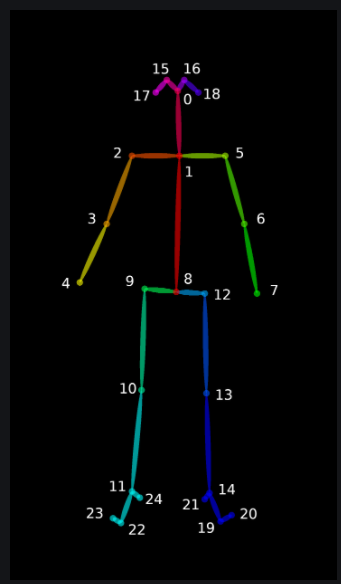

In [925]:
data['FrameSequences'][0]['Frames'][0]['DetectedObjects'][0]['Bones']

[275.9837646484375,
 227.9407958984375,
 270.969970703125,
 219.89068603515625,
 258.9251403808594,
 227.9242401123047,
 266.987060546875,
 238.97813415527344,
 289.9987487792969,
 235.9783935546875,
 282.01995849609375,
 210.9084930419922,
 301.0362854003906,
 204.88079833984375,
 299.04266357421875,
 220.92724609375,
 281.98822021484375,
 228.98980712890625,
 274.96490478515625,
 233.96011352539062,
 273.9798583984375,
 244.9581298828125,
 289.9798583984375,
 250.9749298095703,
 289.9675598144531,
 226.96400451660156,
 297.990478515625,
 245.0159912109375,
 310.0482177734375,
 268.0782165527344,
 -1.0,
 -1.0,
 275.0191650390625,
 221.9738311767578,
 -1.0,
 -1.0,
 275.00274658203125,
 219.9221649169922,
 314.0617370605469,
 278.061767578125,
 315.1175537109375,
 276.0672912597656,
 312.0362548828125,
 269.0647277832031,
 292.0044250488281,
 260.0325012207031,
 289.99945068359375,
 259.9893798828125,
 290.9930725097656,
 248.01535034179688]

In [663]:
len(data['FrameSequences'][0]['Frames'][0]['DetectedObjects'][0]['BonesDev'])

50

In [664]:
len(data['FrameSequences'][0]['Frames'][0]['DetectedObjects'][0]['BonesConfidence'])

25

In [665]:
data['FrameSequences'][0]['Frames'][0]['DetectedObjects'][0]['BonesConfidence']

[0.41355642676353455,
 0.8493616580963135,
 0.8855234384536743,
 0.723085343837738,
 0.7156240940093994,
 0.8354271650314331,
 0.825817346572876,
 0.7885130643844604,
 0.764427900314331,
 0.6873906850814819,
 0.6676963567733765,
 0.5488036870956421,
 0.7357193231582642,
 0.6638746857643127,
 0.6630005836486816,
 -1.0,
 0.2509077787399292,
 -1.0,
 0.4975438117980957,
 0.6387630105018616,
 0.6669979095458984,
 0.4843718409538269,
 0.5386838316917419,
 0.5228132605552673,
 0.3856295645236969]

In [666]:
# 0-7 15-18

def upper_points(person):
    keys = [0, 1, 2, 3, 4, 5, 6, 7, 15, 16, 17, 18]
    res = []
    for el in keys:
        point = (person['Bones'][2*el], person['Bones'][2*el + 1])
        res.append(point)
    return res

print(upper_points(data['FrameSequences'][0]['Frames'][0]['DetectedObjects'][0]))

[(275.9837646484375, 227.9407958984375), (270.969970703125, 219.89068603515625), (258.9251403808594, 227.9242401123047), (266.987060546875, 238.97813415527344), (289.9987487792969, 235.9783935546875), (282.01995849609375, 210.9084930419922), (301.0362854003906, 204.88079833984375), (299.04266357421875, 220.92724609375), (-1.0, -1.0), (275.0191650390625, 221.9738311767578), (-1.0, -1.0), (275.00274658203125, 219.9221649169922)]


25.0 1851.0


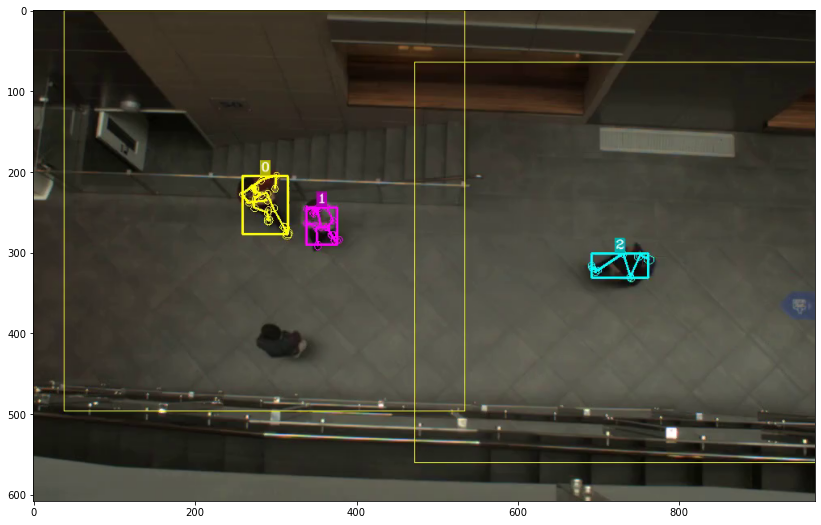

In [667]:
video = cv2.VideoCapture('hse002-detect.mp4')
fps = video.get(cv2.CAP_PROP_FPS)
frame_count = video.get(cv2.CAP_PROP_FRAME_COUNT)
print(fps, frame_count)
ret, frame = video.read()

rgb_img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(14,14))
plt.imshow(rgb_img)
plt.show()

In [668]:
# we can get wrong distances in cases like this
upper_points(data['FrameSequences'][0]['Frames'][25]['DetectedObjects'][0])

[(349.0943298339844, 253.7761993408203),
 (351.1083068847656, 246.79116821289062),
 (341.03765869140625, 248.76502990722656),
 (340.07476806640625, 262.79632568359375),
 (350.1240234375, 266.80596923828125),
 (365.13397216796875, 245.7582550048828),
 (372.1101989746094, 262.82818603515625),
 (363.09600830078125, 269.80487060546875),
 (345.0992736816406, 252.75503540039062),
 (350.1190490722656, 251.80117797851562),
 (-1.0, -1.0),
 (356.0747375488281, 246.7836456298828)]

In [669]:
f_0_p_0 = upper_points(data['FrameSequences'][0]['Frames'][0]['DetectedObjects'][0])

def dist(k1, k2):
    x1, y1 = k1[0], k1[1]
    x2, y2 = k2[0], k2[1]
    if x1 == -1 or x2 == -1:
        return np.nan
    return sqrt((x1-x2)**2 + (y1-y2)**2)

def dist_1d(k1, k2):
    return sqrt((k1-k2)**2)

def get_distances(points):
    distances = {}
    distances['plechi'] = dist(points[2], points[5])
    distances['kisti'] = dist(points[4], points[7])
    distances['plecho_locot_l'] = dist(points[5], points[6])
    distances['plecho_locot_r'] = dist(points[2], points[3])
    distances['locot_kist_l'] = dist(points[6], points[7])
    distances['locot_kist_r'] = dist(points[3], points[4])
    distances['plecho_kist_l'] = dist(points[5], points[7])
    distances['plecho_kist_r'] = dist(points[2], points[4])
    distances['golova_kist_l'] = dist(points[0], points[7])
    distances['golova_kist_r'] = dist(points[0], points[4])
    return distances

get_distances(f_0_p_0)

{'plechi': 28.68634295508241,
 'kisti': 17.559311908747794,
 'plecho_locot_l': 19.948779219626285,
 'plecho_locot_r': 13.681488598701145,
 'locot_kist_l': 16.16981797994745,
 'locot_kist_r': 23.20638358247547,
 'plecho_kist_l': 19.75216192949342,
 'plecho_kist_r': 32.100444336066325,
 'golova_kist_l': 24.10192317082244,
 'golova_kist_r': 16.15619869498997}

In [670]:
def frame_summary(frame_json):
    summary = {}
    for person in frame_json['DetectedObjects']:
        track = person['Track']
        if track != -1:
            points = upper_points(person)
            summary[track] = get_distances(points)
#         print(track, summary[track])
#         print()
    return summary

frame_summary(data['FrameSequences'][0]['Frames'][1840])

{1: {'plechi': 27.10384869932657,
  'kisti': nan,
  'plecho_locot_l': 20.0399742682165,
  'plecho_locot_r': 15.338348496599131,
  'locot_kist_l': nan,
  'locot_kist_r': 10.236886143918792,
  'plecho_kist_l': nan,
  'plecho_kist_r': 14.825485448031733,
  'golova_kist_l': nan,
  'golova_kist_r': nan},
 5: {'plechi': 29.866866124011526,
  'kisti': 62.40014673147527,
  'plecho_locot_l': 17.045421495460896,
  'plecho_locot_r': 10.23224932784874,
  'locot_kist_l': 4.128388364951924,
  'locot_kist_r': 14.441998004655499,
  'plecho_kist_l': 18.29550583069868,
  'plecho_kist_r': 22.84176633171463,
  'golova_kist_l': nan,
  'golova_kist_r': nan},
 21: {'plechi': 25.06138084453777,
  'kisti': 54.15341421135723,
  'plecho_locot_l': 16.283133191049696,
  'plecho_locot_r': 9.934875179352003,
  'locot_kist_l': 6.753221022651056,
  'locot_kist_r': 13.150096922325082,
  'plecho_kist_l': 22.850901174512632,
  'plecho_kist_r': 20.31622896090057,
  'golova_kist_l': 39.71228772791643,
  'golova_kist_r': 39

In [671]:
# 3 turns into 19 

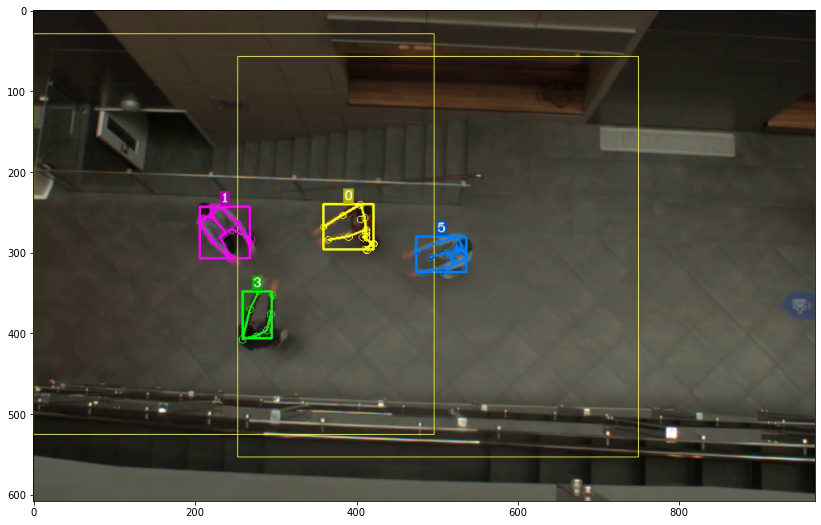

In [672]:
def show_frame(frame_number):
    frame = 0
    video = cv2.VideoCapture('hse002-detect.mp4')
    for i in range(frame_number):
        ret, frame = video.read()

    rgb_img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(14,14))
    plt.imshow(rgb_img)
    plt.show()

show_frame(350)

In [918]:
def video_analysis(frames):
    res = {}
    for i, frame in enumerate(frames):
#         print(i)
        summary = frame_summary(frame)
        for track in summary.keys():
            if track not in res.keys():
                res[track] = {
                        'plechi': [np.nan for j in range(i)],
                        'kisti': [np.nan for j in range(i)],
                        'plecho_locot_l': [np.nan for j in range(i)],
                        'plecho_locot_r': [np.nan for j in range(i)],
                        'locot_kist_l': [np.nan for j in range(i)],
                        'locot_kist_r': [np.nan for j in range(i)],
                        'plecho_kist_l': [np.nan for j in range(i)],
                        'plecho_kist_r': [np.nan for j in range(i)],
                        'golova_kist_l': [np.nan for j in range(i)],
                        'golova_kist_r': [np.nan for j in range(i)]
                }
            res[track]['plechi'].append(summary[track]['plechi'])
            res[track]['kisti'].append(summary[track]['kisti'])
            res[track]['plecho_locot_l'].append(summary[track]['plecho_locot_l'])
            res[track]['plecho_locot_r'].append(summary[track]['plecho_locot_r'])
            res[track]['locot_kist_l'].append(summary[track]['locot_kist_l'])
            res[track]['locot_kist_r'].append(summary[track]['locot_kist_r'])
            res[track]['plecho_kist_l'].append(summary[track]['plecho_kist_l'])
            res[track]['plecho_kist_r'].append(summary[track]['plecho_kist_r'])
            res[track]['golova_kist_l'].append(summary[track]['golova_kist_l'])
            res[track]['golova_kist_r'].append(summary[track]['golova_kist_r'])
        for track in res.keys():
            if track in summary.keys():
                continue
            else:
                res[track]['plechi'].append(np.nan)
                res[track]['kisti'].append(np.nan)
                res[track]['plecho_locot_l'].append(np.nan)
                res[track]['plecho_locot_r'].append(np.nan)
                res[track]['locot_kist_l'].append(np.nan)
                res[track]['locot_kist_r'].append(np.nan)
                res[track]['plecho_kist_l'].append(np.nan)
                res[track]['plecho_kist_r'].append(np.nan)
                res[track]['golova_kist_l'].append(np.nan)
                res[track]['golova_kist_r'].append(np.nan)
    return res

video_res = video_analysis(data['FrameSequences'][0]['Frames'])

In [674]:
video_res.keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22])

28.410753300759136


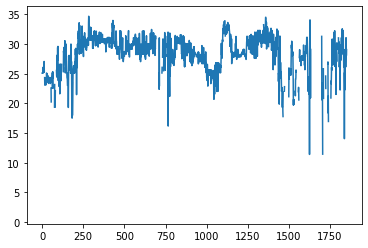

In [675]:
print(np.nanmean(video_res[1]['plechi']))
plt.plot(video_res[1]['plechi']);

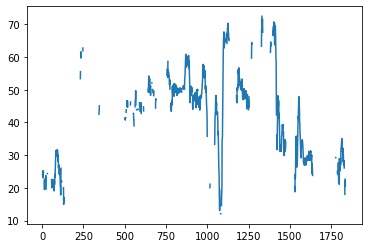

In [676]:
plt.plot(video_res[0]['golova_kist_l'])

### Gap filling + visualised

In [677]:
def step_filna(inp):
    start = -1
    count = 0
    l = inp.copy()
    for i in range(len(l)):
        if np.isnan(l[i]):
            if start == -1:
                start = i
            count += 1
        else:
            if start == 0:
                start = -1
                count = 0
            if start != -1:
                dif = l[start-1] - l[start+count]
                step = dif/(count+1)
                val = l[start-1]
                for j in range(start, start+count):
                    val -= step
                    l[j] = val
                start = -1
                count = 0
    return l

step_filna([np.nan, 1, np.nan, np.nan, np.nan, 5, 8, np.nan, np.nan, 2, np.nan, 2, np.nan, np.nan])

[nan, 1, 2.0, 3.0, 4.0, 5, 8, 6.0, 4.0, 2, 2.0, 2, nan, nan]

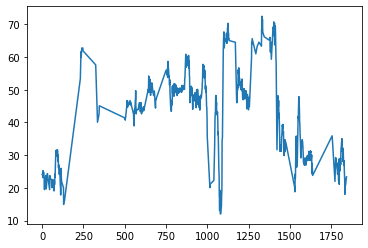

In [678]:
a = step_filna(video_res[0]['golova_kist_l'])
plt.plot(a)

### Analyse person_1

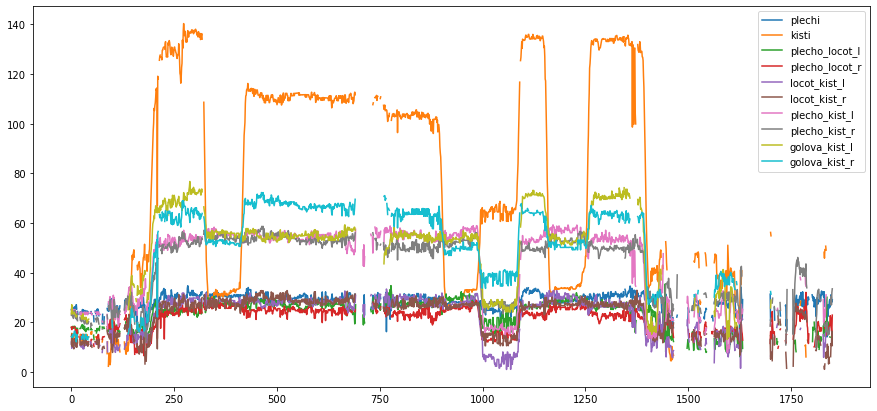

In [927]:
plt.figure(figsize=(15,7))
for key in video_res[1].keys():
    a = (video_res[1][key])
    plt.plot(a)
    plt.legend(video_res[1].keys())

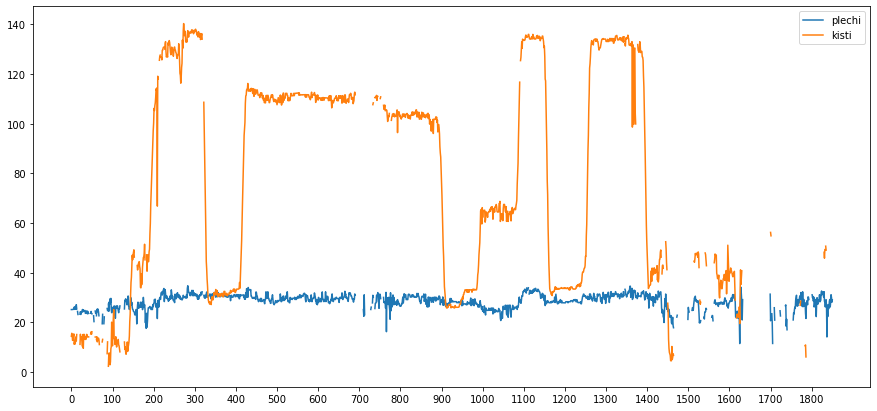

In [680]:
plt.figure(figsize=(15,7))
a = (video_res[1]['plechi'])
plt.plot(a)
a = (video_res[1]['kisti'])
plt.plot(a)
plt.legend(video_res[1].keys())
plt.xticks(np.arange(0, 1851, 100))
plt.show()

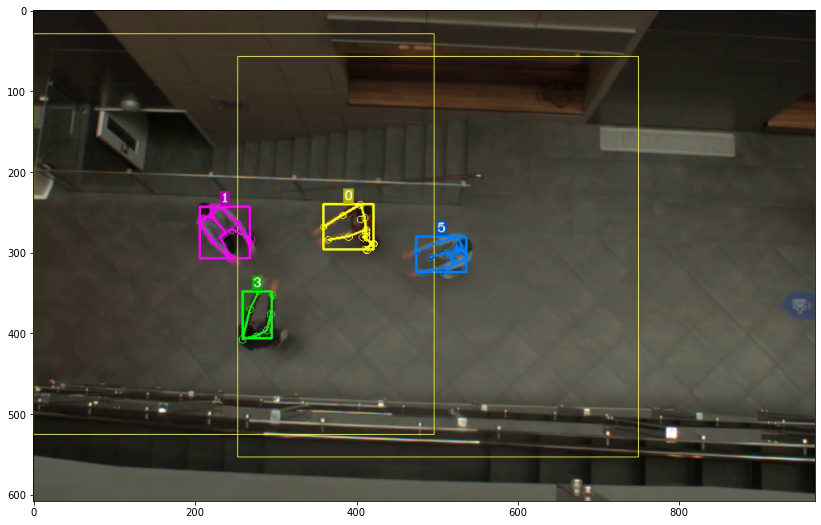

In [681]:
show_frame(350)

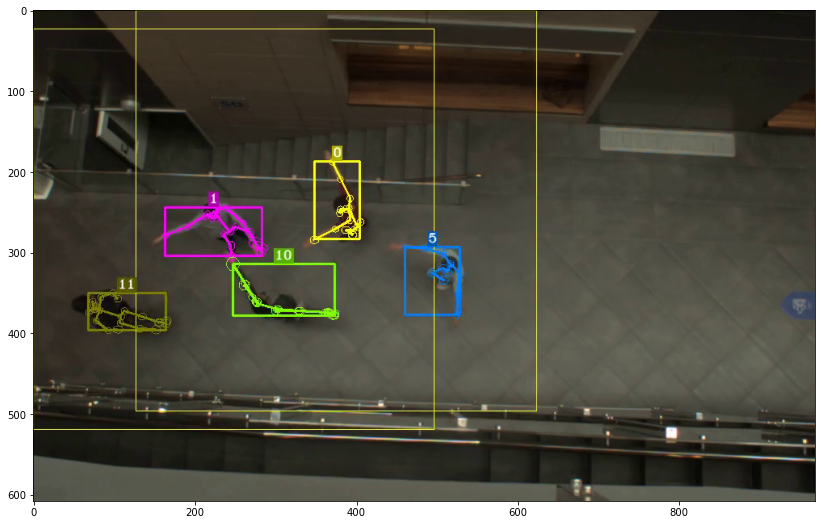

In [682]:
show_frame(600)

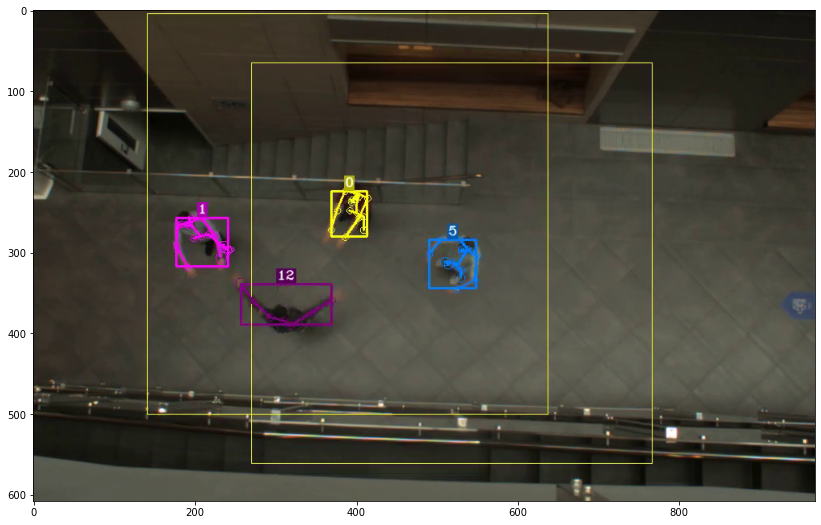

In [683]:
show_frame(1250)

### Other subjects 

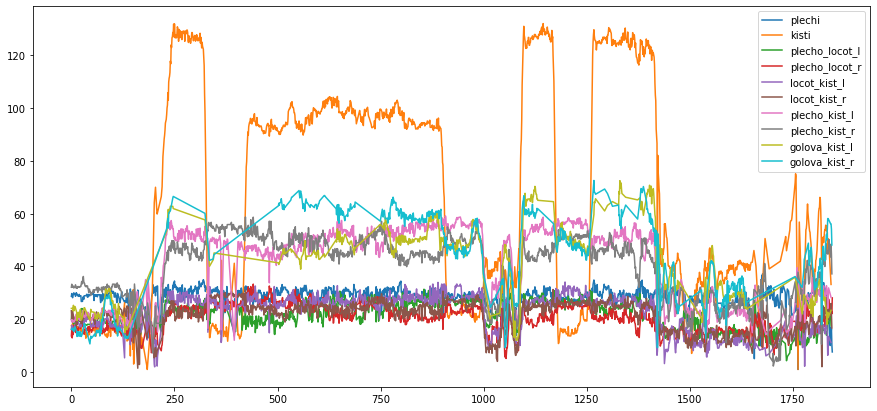

In [684]:
plt.figure(figsize=(15,7))
for key in video_res[0].keys():
    a = step_filna(video_res[0][key])
    plt.plot(a)
    plt.legend(video_res[0].keys())

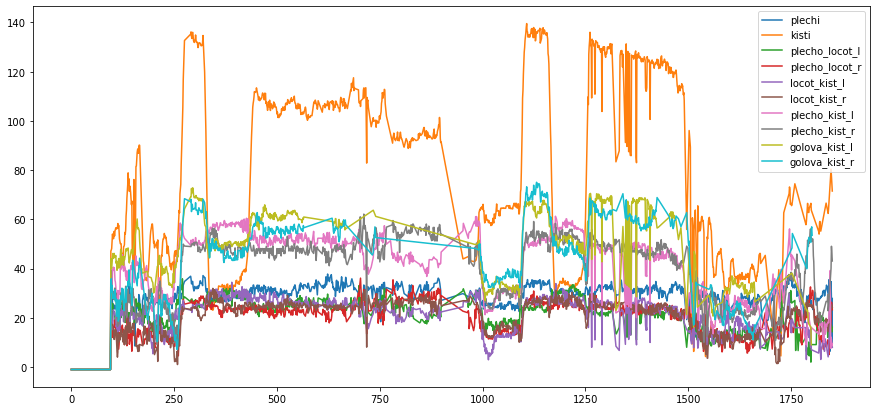

In [685]:
plt.figure(figsize=(15,7))
for key in video_res[5].keys():
    a = step_filna(video_res[5][key])
    plt.plot(a)
    plt.legend(video_res[5].keys())

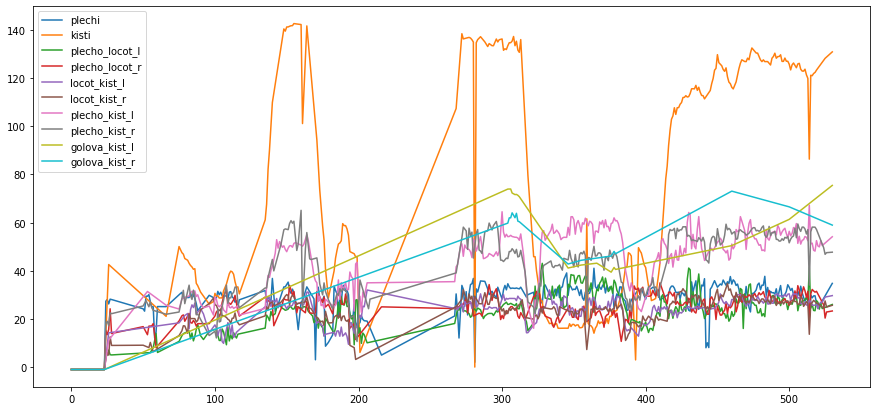

In [686]:
plt.figure(figsize=(15,7))
for key in video_res[3].keys():
    a = step_filna(video_res[3][key])
    plt.plot(a)
    plt.legend(video_res[3].keys())

### Clustering on person_1

### Scale using 'plechi'

In [687]:
df_scaled1 = pd.DataFrame()

pl = np.nanmedian(video_res[1]['plechi'])
for key in video_res[1].keys():
#     df_scaled1[key] = step_filna(video_res[1][key])/pl
    df_scaled1[key] = video_res[1][key]/pl
    
df_scaled1 = df_scaled1.drop(columns=['plechi'])
df_scaled1 = df_scaled1.dropna()
df_scaled1.head()

,kisti,plecho_locot_l,plecho_locot_r,locot_kist_l,locot_kist_r,plecho_kist_l,plecho_kist_r,golova_kist_l,golova_kist_r
0,0.494957,0.617218,0.621340,0.414530,0.385987,0.862819,0.787829,0.807189,0.488387
1,0.536580,0.602628,0.587964,0.328850,0.526300,0.874279,0.842423,0.933290,0.494620
2,0.496934,0.617000,0.622239,0.415156,0.353681,0.864464,0.787879,0.808564,0.488729
3,0.437373,0.617953,0.623331,0.415231,0.416274,0.864286,0.768141,0.830966,0.481011
4,0.490477,0.634722,0.621826,0.391812,0.351816,0.864972,0.772627,0.808645,0.521893


C:\Users\nmark\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  f"KMeans is known to have a memory leak on Windows "
C:\Users\nmark\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:882: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  f"KMeans is known to have a memory leak on Windows "


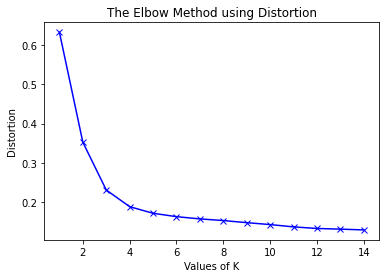

In [688]:
X = df_scaled1
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 15)
 
for k in K:
    # Building and fitting the model
    scaler = MinMaxScaler()
    X = scaler.fit_transform(X)
    kmeanModel = KMeans(n_clusters=k).fit(X)
    kmeanModel.fit(X)
 
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / X.shape[0])
    inertias.append(kmeanModel.inertia_)
 
    mapping1[k] = sum(np.min(cdist(X, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / X.shape[0]
    mapping2[k] = kmeanModel.inertia_
    

plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

In [689]:
scaler = MinMaxScaler()
X = scaler.fit_transform(df_scaled1)
kmeans = KMeans(n_clusters=5, random_state=42).fit(X)

labels = kmeans.labels_

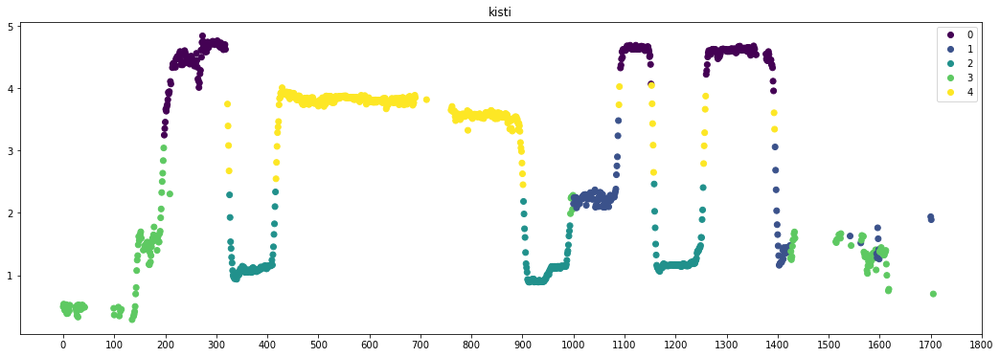

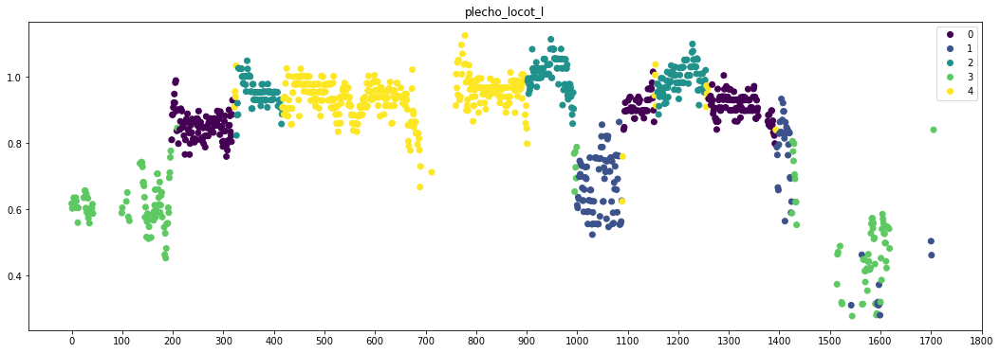

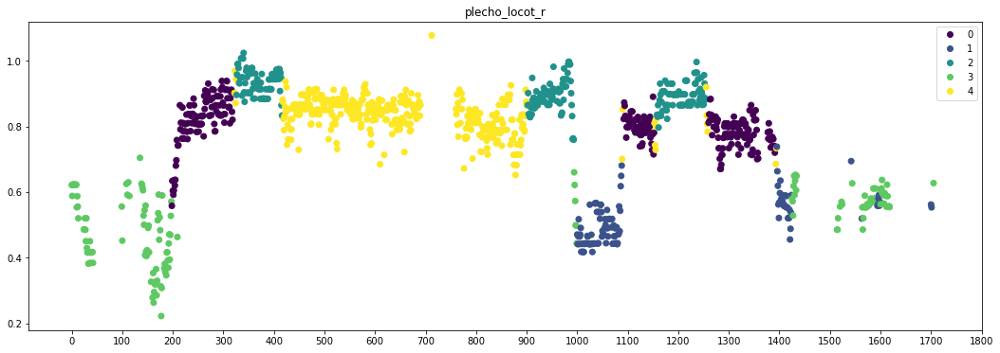

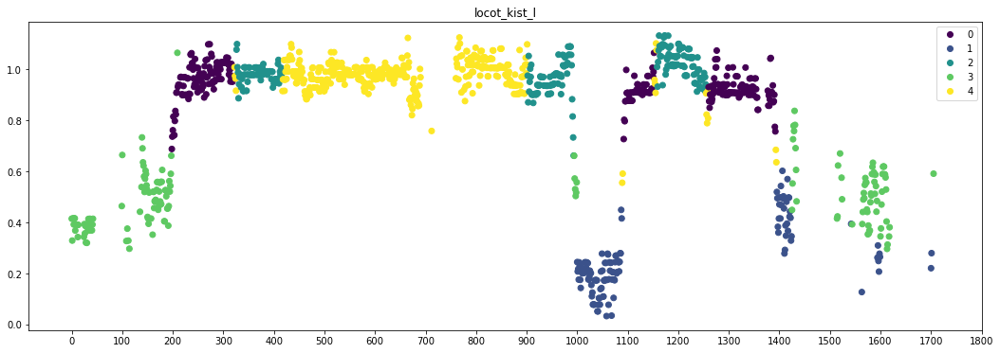

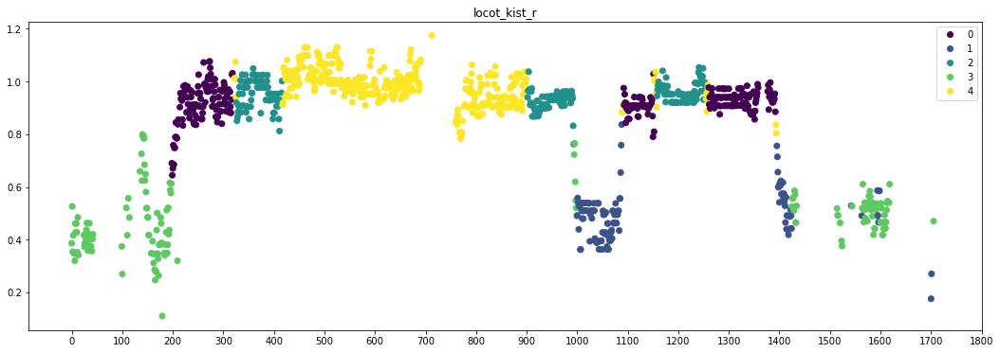

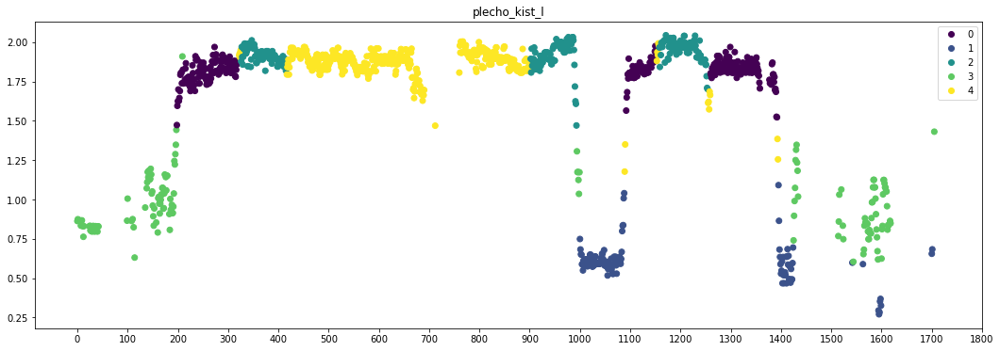

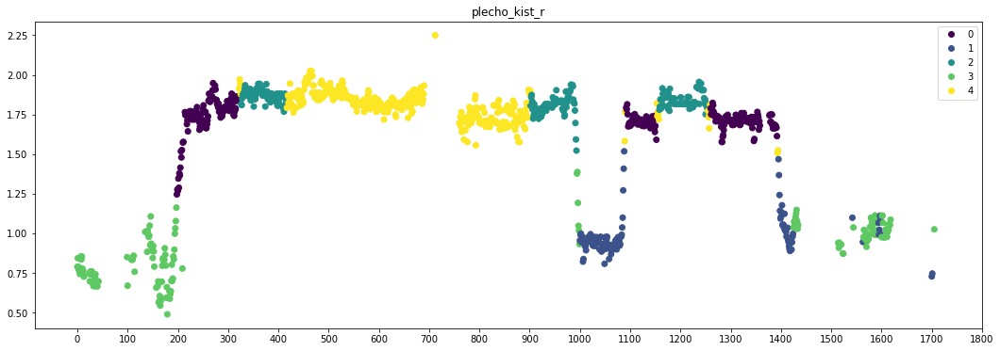

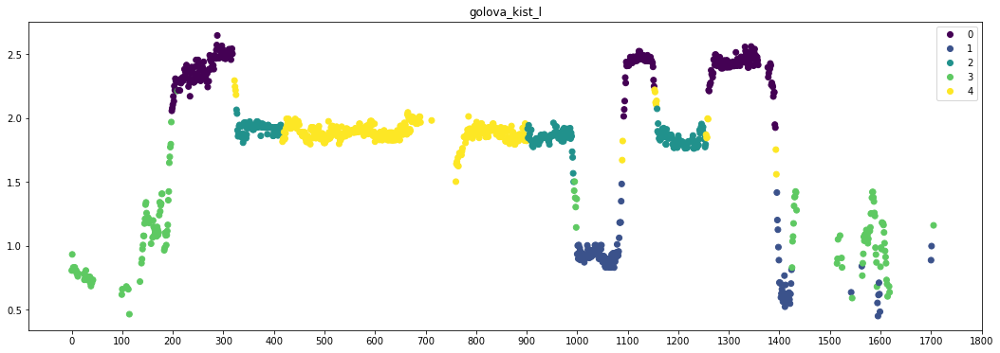

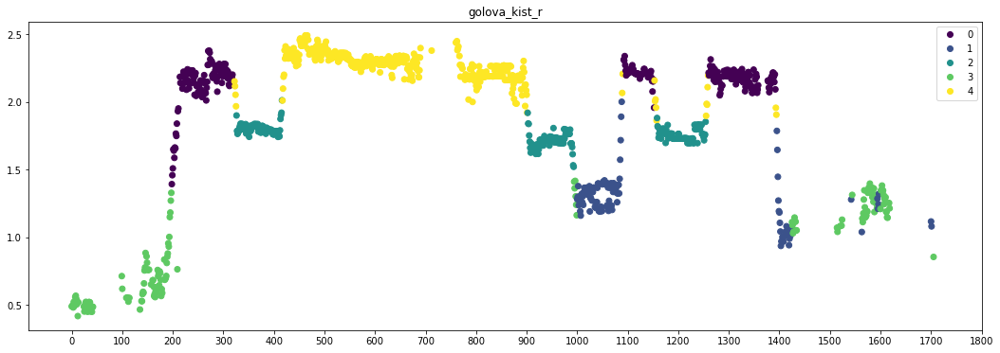

In [690]:
# Plot each of the time series with labeled clusters
for col in df_scaled1.columns:
    fig, ax = plt.subplots(figsize=(18, 6))
    scatter = plt.scatter(df_scaled1.index, df_scaled1[col], c=labels)
    plt.legend(handles=scatter.legend_elements()[0], labels=set(labels))
    plt.xticks(np.arange(0, 1851, 100))
    plt.title(col)
    plt.show()

In [691]:
print(scaler.inverse_transform(kmeans.cluster_centers_))

[[4.53416935 0.88734738 0.80211272 0.93556908 0.91932167 1.81875682
  1.71984631 2.40108279 2.16403049]
 [2.0456837  0.67870979 0.51120713 0.25388115 0.49409765 0.59820813
  0.97757878 0.87081516 1.27250908]
 [1.17374083 0.9876887  0.90504594 0.98843326 0.94545267 1.92836156
  1.83984493 1.8684582  1.7580893 ]
 [1.22351153 0.57016246 0.5154379  0.4934085  0.47278986 0.95816001
  0.89226006 1.05154292 0.89925565]
 [3.69940586 0.93859788 0.83418261 0.97565653 0.98345961 1.87074305
  1.81050574 1.89107304 2.27120848]]


In [692]:
closest, _ = pairwise_distances_argmin_min(scaler.inverse_transform(kmeans.cluster_centers_), X)
print(closest)
key_frames = []
for pos in closest:
    el = df_scaled1.loc[df_scaled1['kisti'] == df_scaled1.values[pos][0]].index[0]
    key_frames.append(el)
print(key_frames)

[162 906 162 919 162]
[273, 1094, 273, 1107, 273]


0


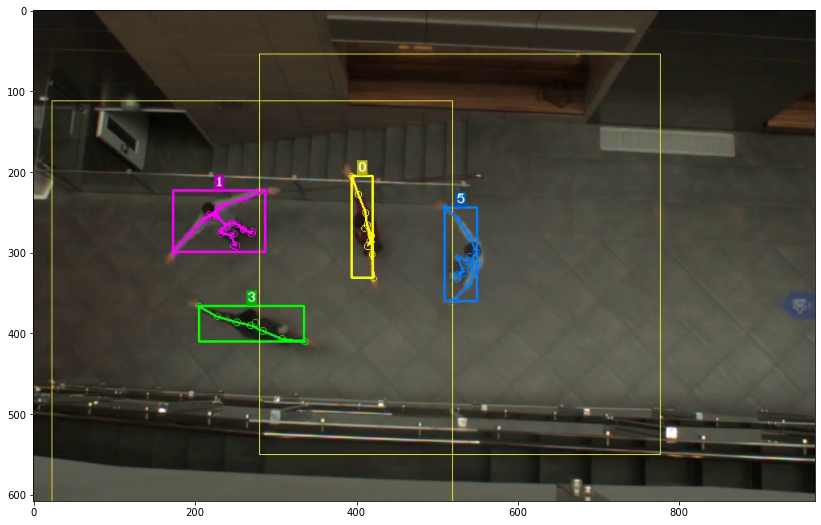

1


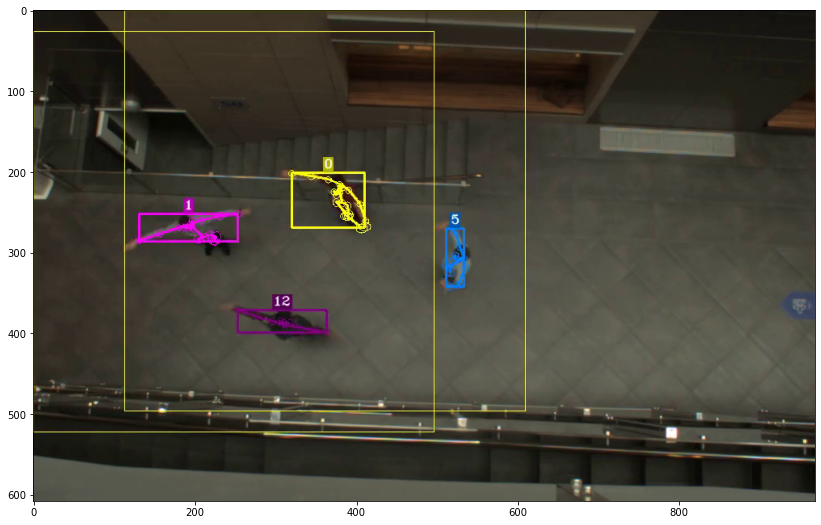

2


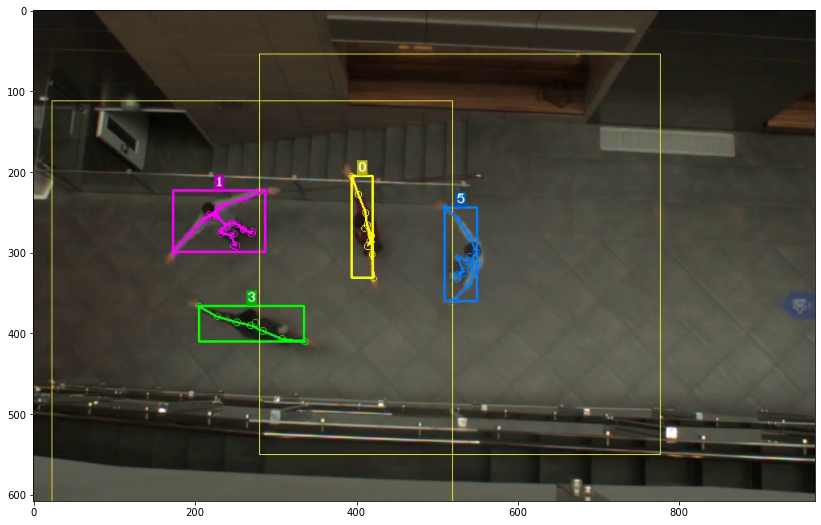

3


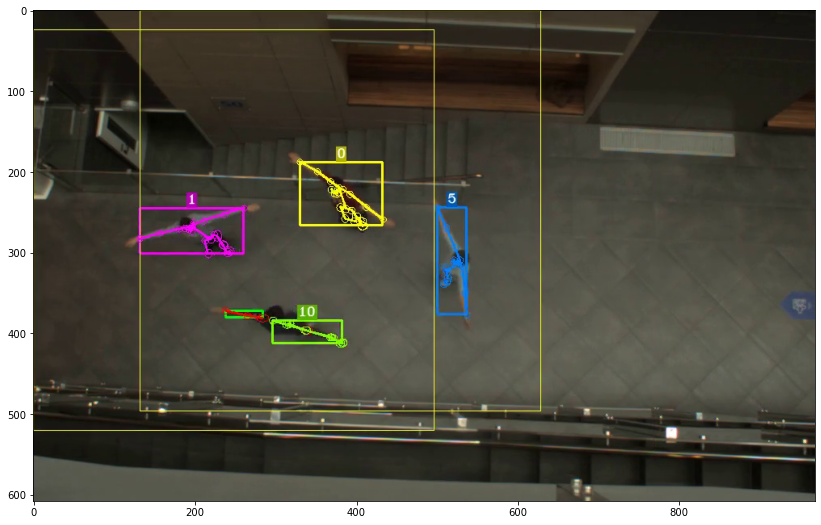

4


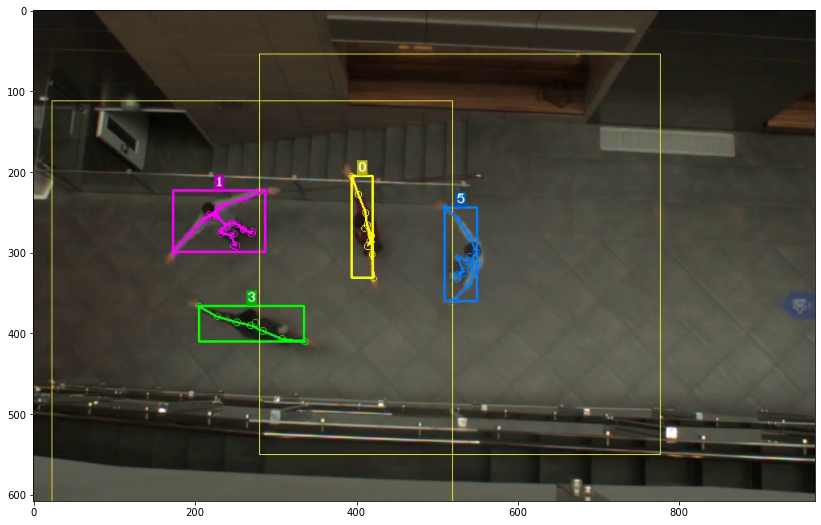

In [693]:
for i,frame in enumerate(key_frames):
    print(i)
    show_frame(frame)

### Clusering using DBScan

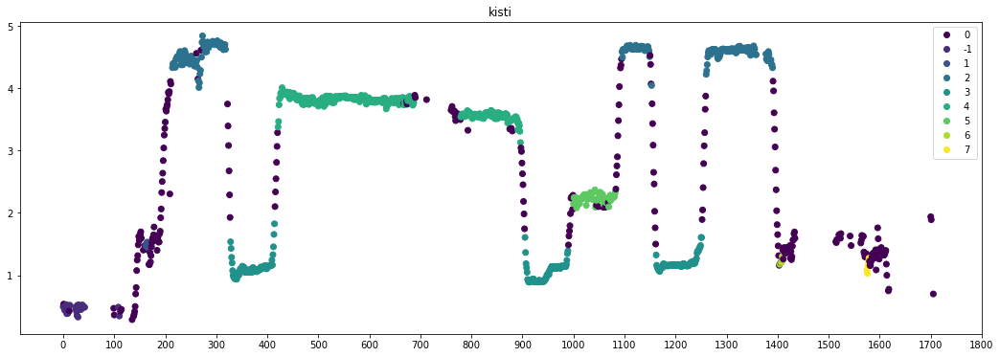

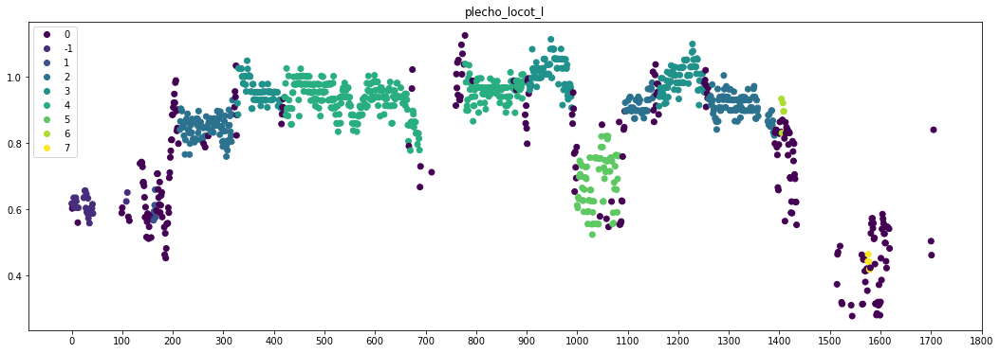

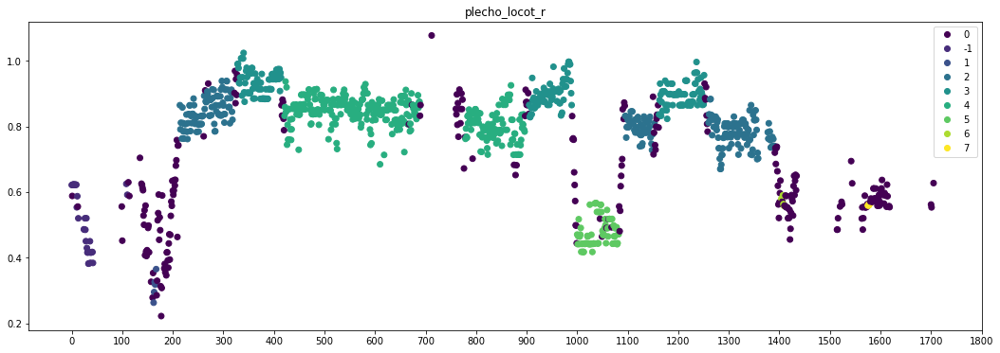

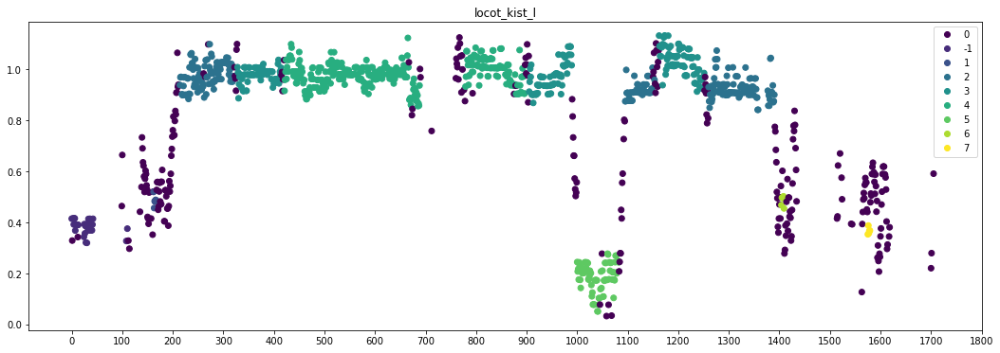

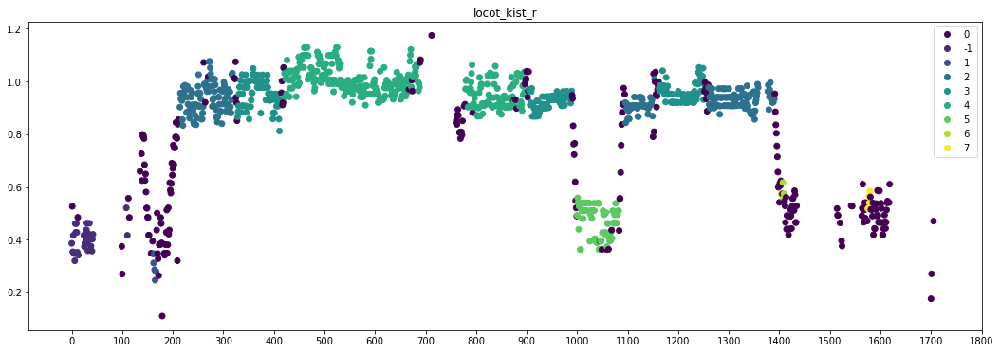

...

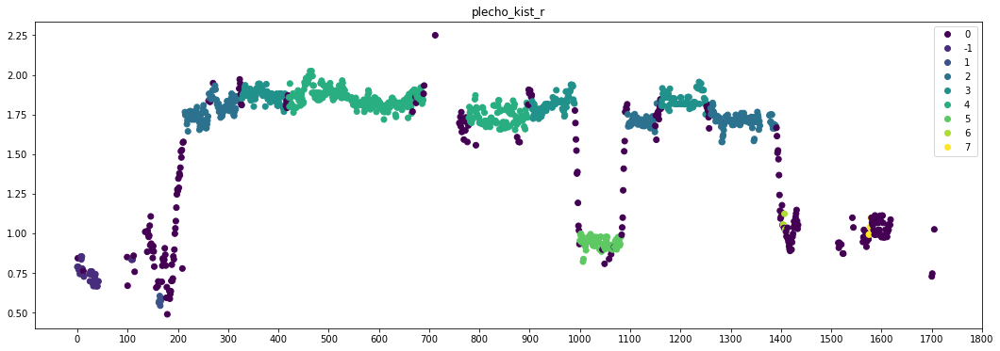

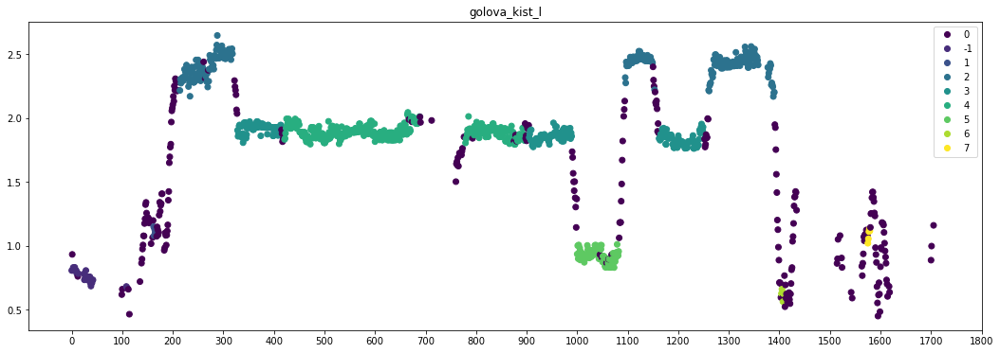

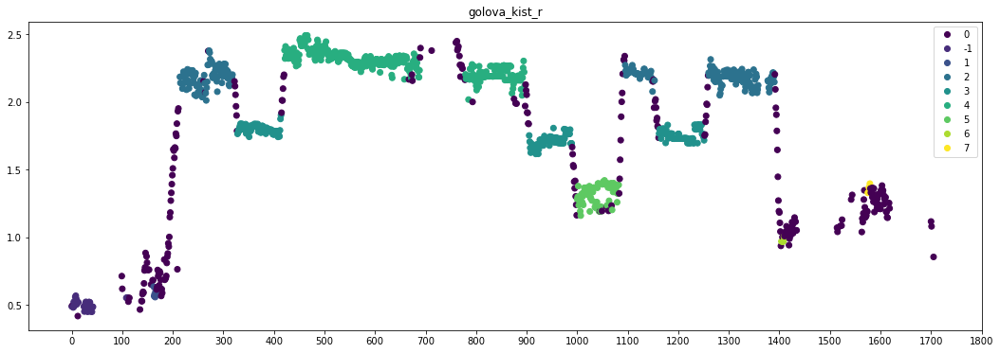

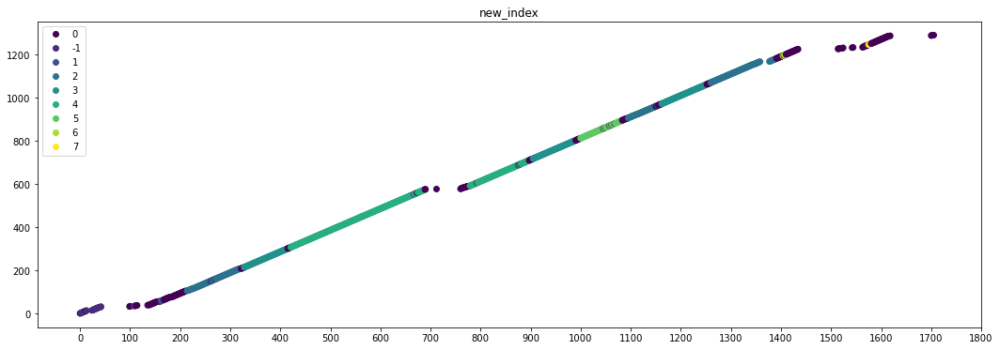

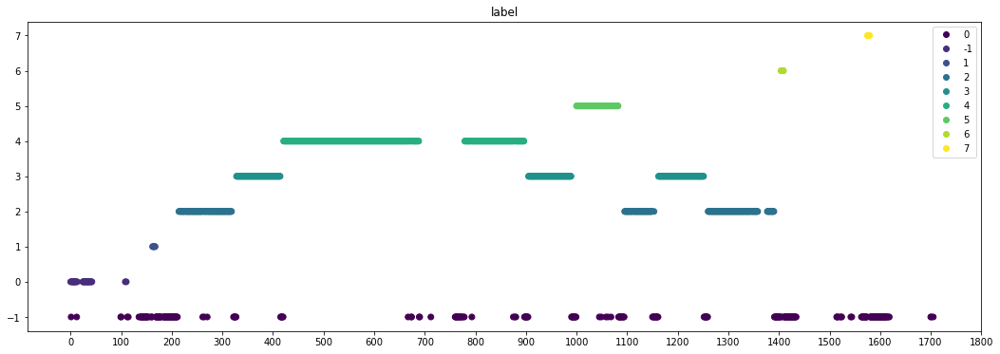

In [834]:
from sklearn.cluster import DBSCAN

df_scaled1 = pd.DataFrame()

pl = np.nanmedian(video_res[1]['plechi'])
for key in video_res[1].keys():
#     df_scaled1[key] = step_filna(video_res[1][key])/pl
    df_scaled1[key] = video_res[1][key]/pl
    
df_scaled1 = df_scaled1.drop(columns=['plechi'])
df_scaled1 = df_scaled1.dropna()

scaler = MinMaxScaler()
X = scaler.fit_transform(df_scaled1)
clustering = DBSCAN(eps=0.1, min_samples=5).fit(X)

labels = clustering.labels_
df_scaled1['new_index'] = range(len(df_scaled1))
df_scaled1['label'] = labels
# Plot each of the time series with labeled clusters
for col in df_scaled1.columns:
    fig, ax = plt.subplots(figsize=(18, 6))
    scatter = plt.scatter(df_scaled1.index, df_scaled1[col], c=labels)
    plt.legend(handles=scatter.legend_elements()[0], labels=[0,-1,1,2,3,4,5,6,7])
    plt.xticks(np.arange(0, 1851, 100))
    plt.title(col)
    plt.show()

In [724]:
key_frames = []
l = []
for label, pos in zip(labels[clustering.core_sample_indices_], clustering.core_sample_indices_):
    if label not in l:
        l.append(label)
        el = df_scaled1.loc[df_scaled1['kisti'] == df_scaled1.values[pos][0]].index[0]
        key_frames.append(el)
print(l)
print(key_frames)

[0, 1, 2, 3, 4, 5, 6, 7]
[0, 164, 214, 328, 422, 1000, 1408, 1577]


0


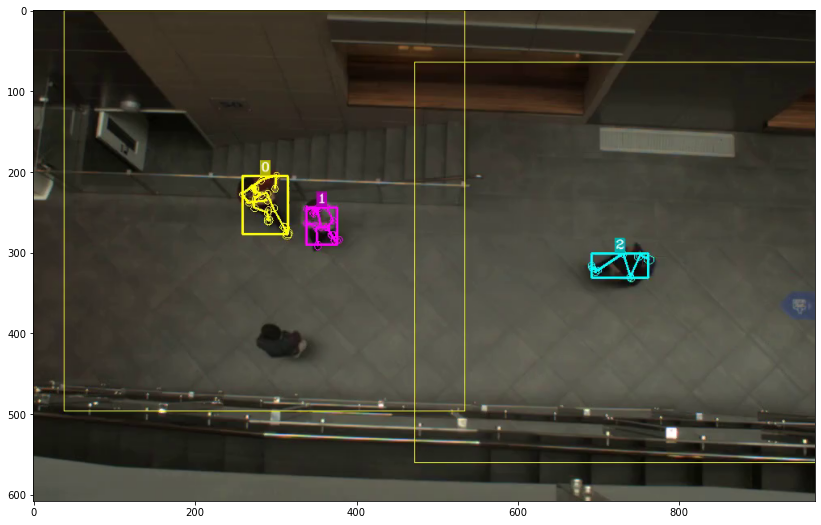

1


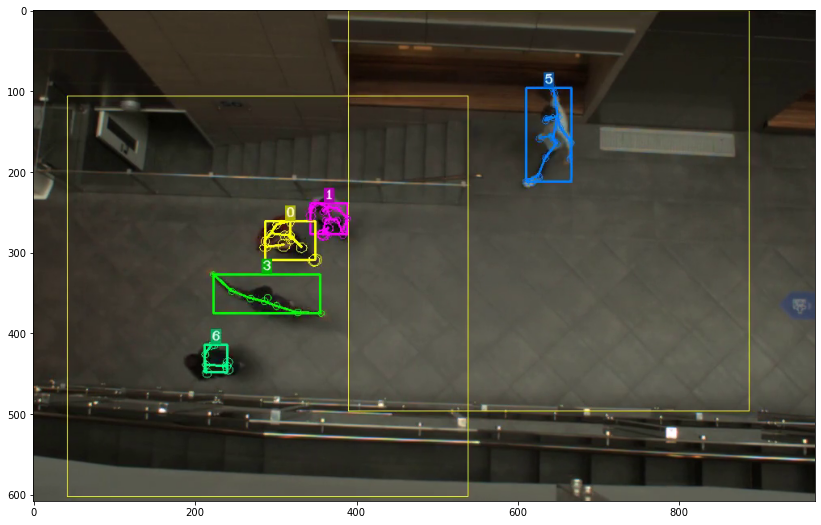

2


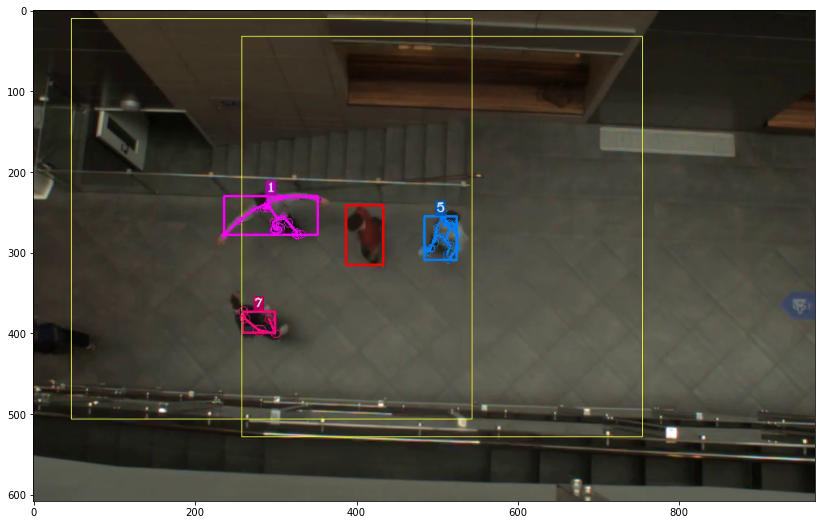

3


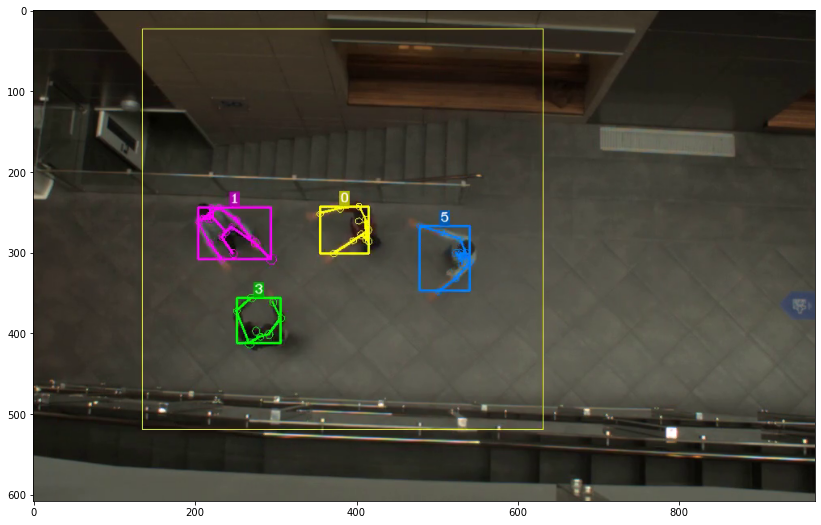

4


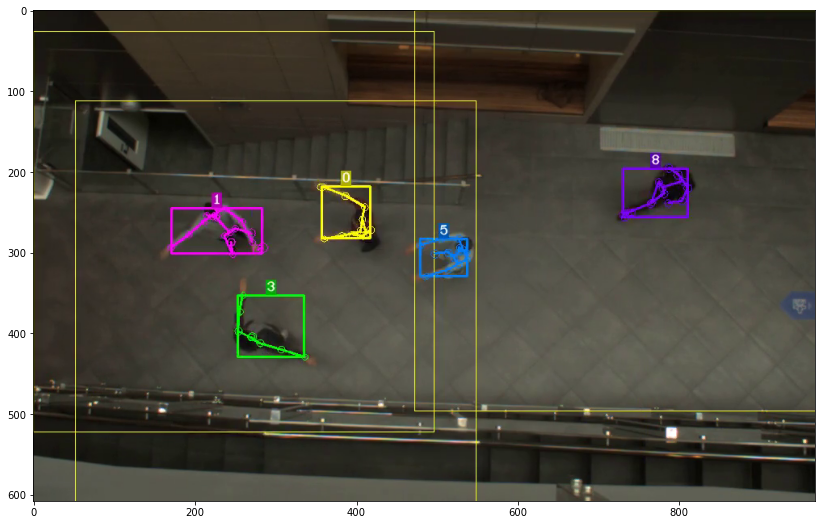

5


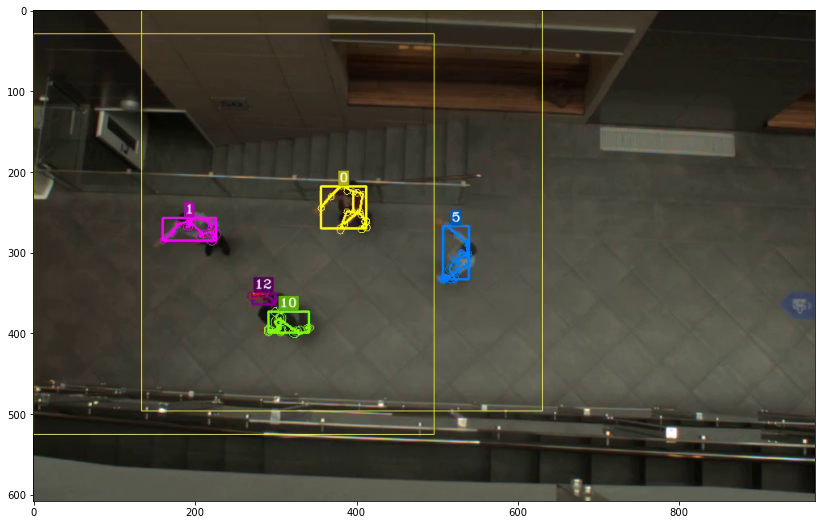

6


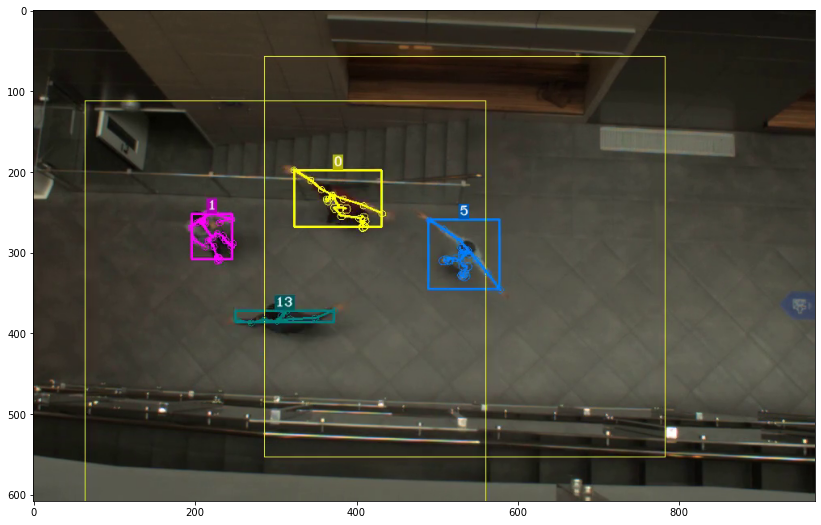

7


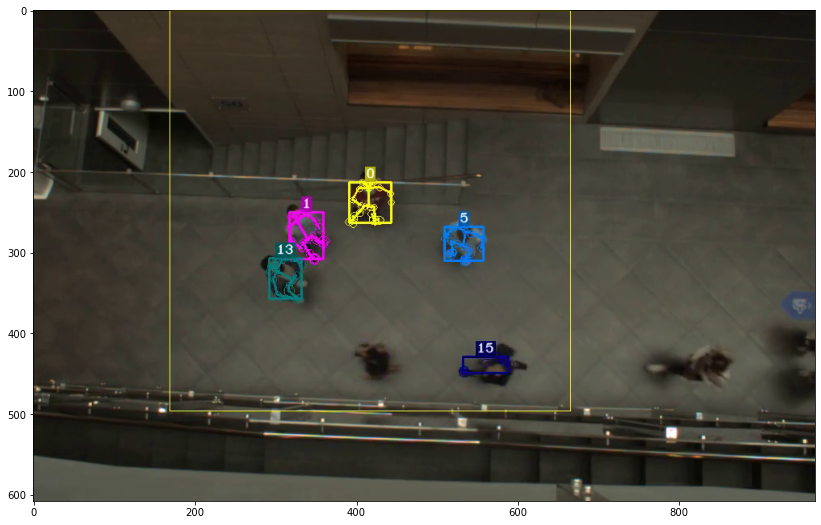

In [723]:
for i, num in enumerate(key_frames):
    print(i)
    show_frame(num+1)

In [ ]:
# ГЛОБАЛЬНЫЕ ОБОЗНАЧЕНИЯ

# 0 - руки скрещены
# 1 (в общих значениях) - локти в стороны, кисти близко спереди
# 2 - руки в стороны (Т)
# 3 - руки вперед
# 4 - одна рука вперед, одна в сторону (Г) 
# 5 - руки вверх
# 7 - руки "по швам"
# -1 - шум, переход между позами

# 1, 6 - слишком маленькие классы (не входят в общие данные)

In [835]:
noise = df_scaled1[df_scaled1['label'] == -1].drop(columns=['new_index'])
noise

,kisti,plecho_locot_l,plecho_locot_r,locot_kist_l,locot_kist_r,plecho_kist_l,plecho_kist_r,golova_kist_l,golova_kist_r,label
1,0.536580,0.602628,0.587964,0.328850,0.526300,0.874279,0.842423,0.933290,0.494620,-1
12,0.428793,0.559616,0.555657,0.342552,0.484514,0.762543,0.761158,0.760966,0.417238,-1
99,0.469334,0.588797,0.555726,0.463935,0.374404,0.864981,0.849343,0.618702,0.712820,-1
100,0.361458,0.604705,0.451661,0.664044,0.269555,1.005296,0.668584,0.660879,0.618855,-1
112,0.420933,0.577117,0.629540,0.328640,0.556929,0.823130,0.858186,0.659990,0.524010,-1
...,...,...,...,...,...,...,...,...,...,...
1617,0.748926,0.541089,0.557050,0.344821,0.540695,0.863898,1.053076,0.682523,1.253675,-1
1618,0.776035,0.481563,0.553796,0.380933,0.610279,0.848441,1.085870,0.636729,1.214075,-1
1700,1.939250,0.503572,0.561863,0.220656,0.175628,0.654692,0.727234,0.888008,1.116899,-1
1701,1.891558,0.461237,0.553134,0.279615,0.270164,0.683018,0.745339,0.998210,1.080611,-1


In [836]:
from collections import Counter
Counter(labels[clustering.core_sample_indices_])

Counter({0: 30, 1: 2, 2: 252, 3: 256, 4: 363, 5: 75, 6: 2, 7: 2})

In [837]:
names = []
for el in video_res[1].keys():
    names.append(el)
names.pop(0)

data_clusters = pd.DataFrame(scaler.inverse_transform(clustering.components_))
data_clusters.columns = names
data_clusters['label'] = labels[clustering.core_sample_indices_]
data_clusters = data_clusters[data_clusters['label'] != 1]
data_clusters = data_clusters[data_clusters['label'] != 6]
data_clusters = data_clusters.append(noise, ignore_index=True)
data_clusters

,kisti,plecho_locot_l,plecho_locot_r,locot_kist_l,locot_kist_r,plecho_kist_l,plecho_kist_r,golova_kist_l,golova_kist_r,label
0,0.494957,0.617218,0.621340,0.414530,0.385987,0.862819,0.787829,0.807189,0.488387,0
1,0.496934,0.617000,0.622239,0.415156,0.353681,0.864464,0.787879,0.808564,0.488729,0
2,0.437373,0.617953,0.623331,0.415231,0.416274,0.864286,0.768141,0.830966,0.481011,0
3,0.490477,0.634722,0.621826,0.391812,0.351816,0.864972,0.772627,0.808645,0.521893,0
4,0.494980,0.605790,0.622377,0.416046,0.346655,0.866419,0.742949,0.809428,0.489846,0
...,...,...,...,...,...,...,...,...,...,...
1231,0.748926,0.541089,0.557050,0.344821,0.540695,0.863898,1.053076,0.682523,1.253675,-1
1232,0.776035,0.481563,0.553796,0.380933,0.610279,0.848441,1.085870,0.636729,1.214075,-1
1233,1.939250,0.503572,0.561863,0.220656,0.175628,0.654692,0.727234,0.888008,1.116899,-1
1234,1.891558,0.461237,0.553134,0.279615,0.270164,0.683018,0.745339,0.998210,1.080611,-1


### Cluster on person 0 

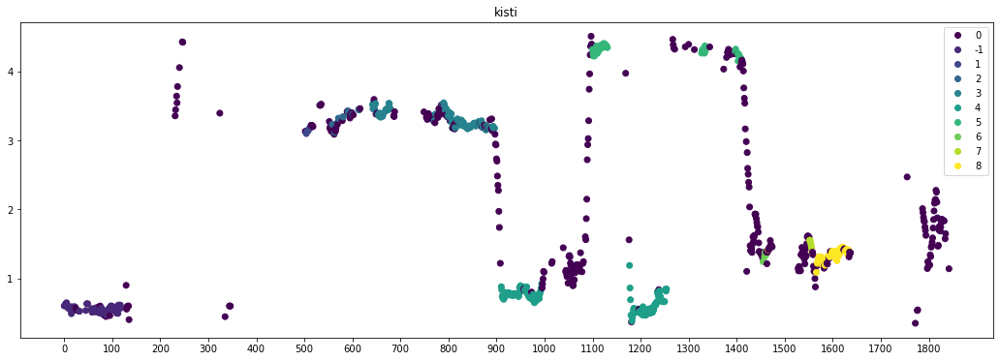

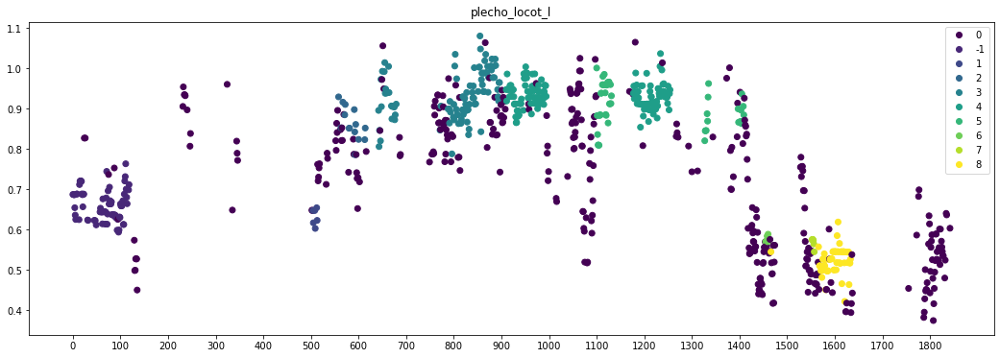

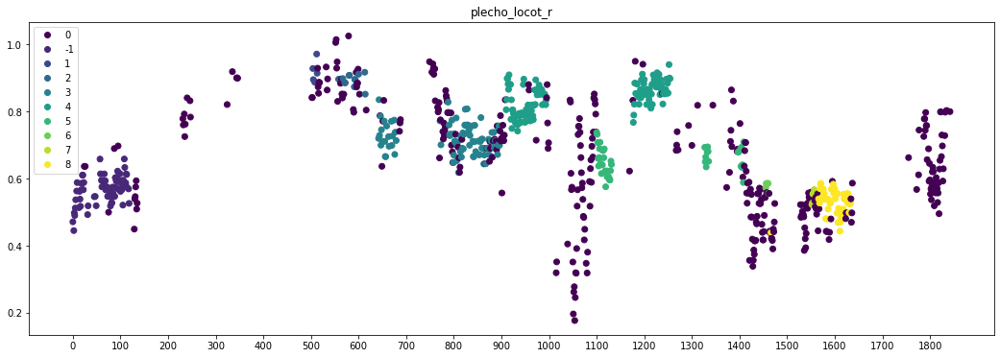

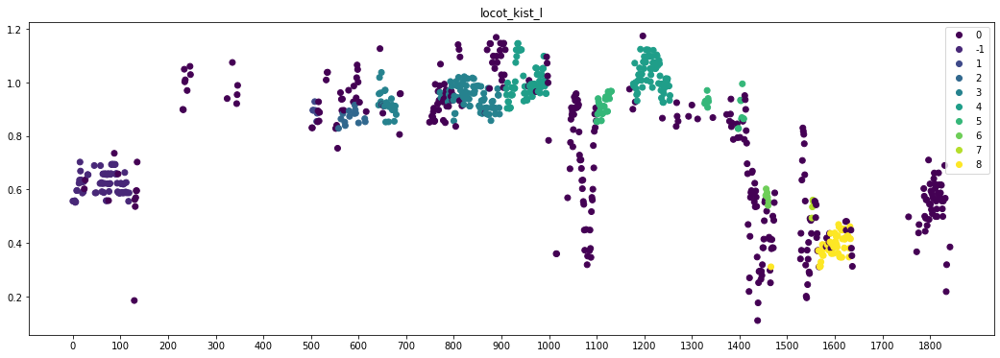

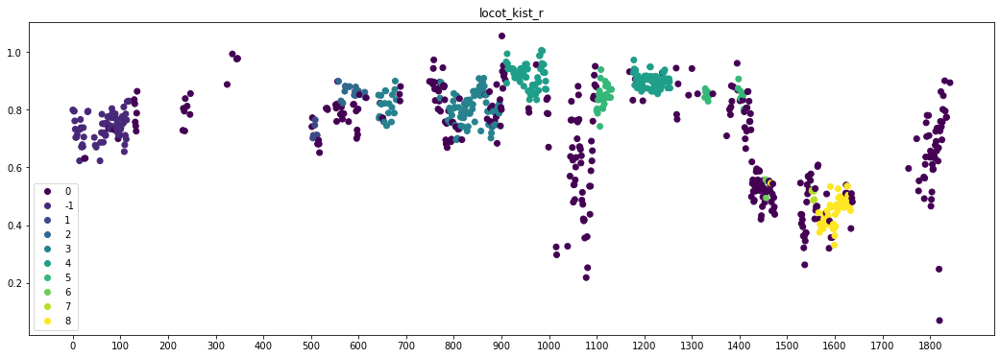

...

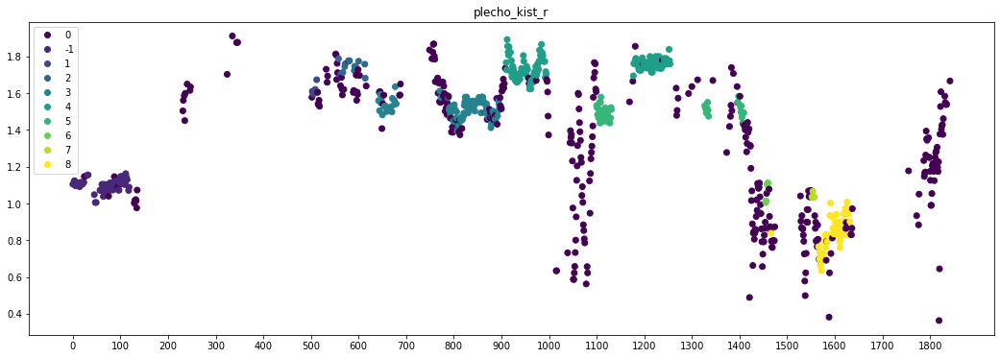

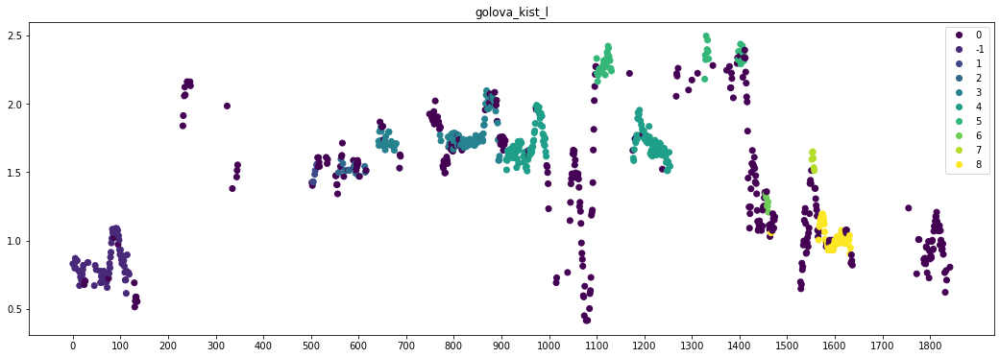

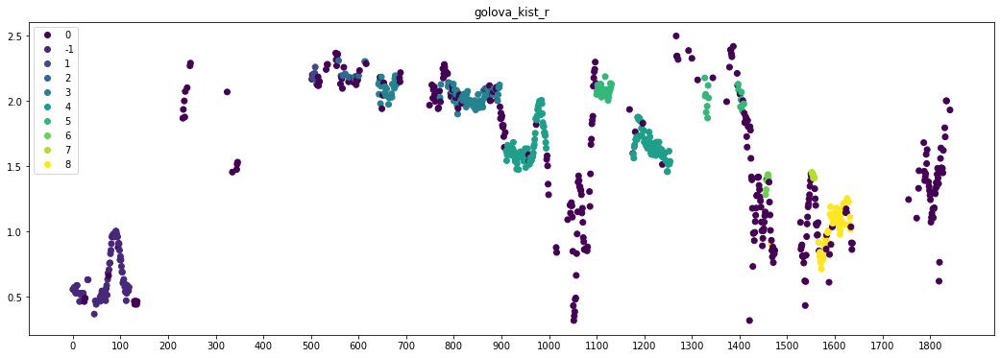

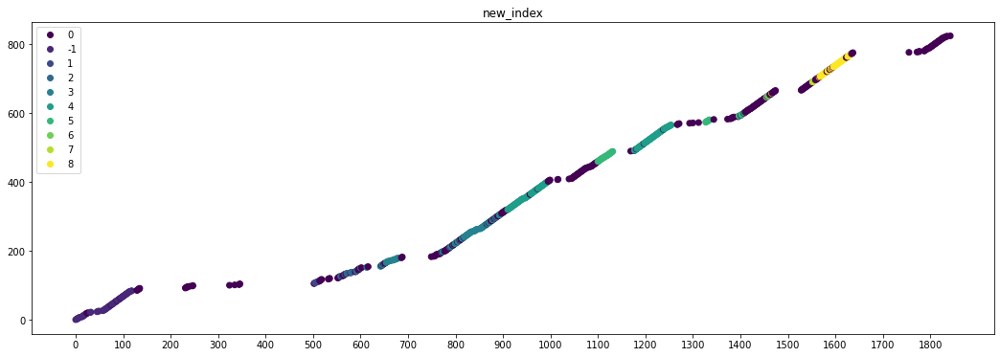

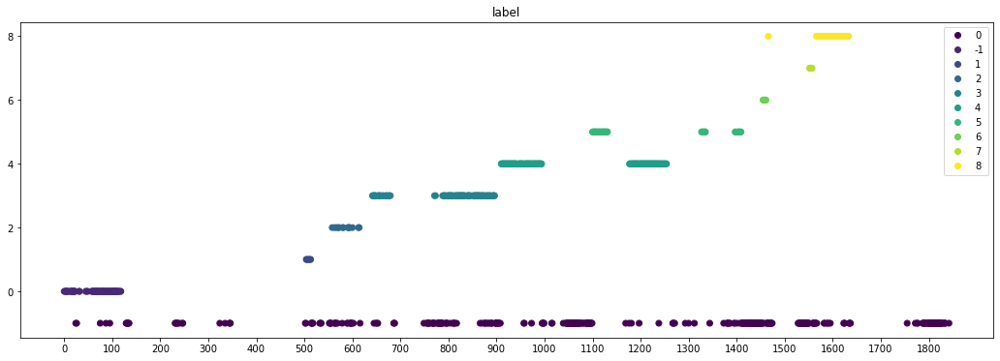

In [838]:
df_scaled0 = pd.DataFrame()

pl = np.nanmedian(video_res[0]['plechi'])
for key in video_res[0].keys():
#     df_scaled1[key] = step_filna(video_res[1][key])/pl
    df_scaled0[key] = video_res[0][key]/pl
    
df_scaled0 = df_scaled0.drop(columns=['plechi'])
df_scaled0 = df_scaled0.dropna()

scaler = MinMaxScaler()
X = scaler.fit_transform(df_scaled0)
clustering0 = DBSCAN(eps=0.1, min_samples=6).fit(X)

labels = clustering0.labels_
df_scaled0['new_index'] = range(len(df_scaled0))
df_scaled0['label'] = labels
# Plot each of the time series with labeled clusters
for col in df_scaled1.columns:
    fig, ax = plt.subplots(figsize=(18, 6))
    scatter = plt.scatter(df_scaled0.index, df_scaled0[col], c=labels)
    plt.legend(handles=scatter.legend_elements()[0], labels=[0,-1,1,2,3,4,5,6,7,8])
    plt.xticks(np.arange(0, 1851, 100))
    plt.title(col)
    plt.show()

In [773]:
key_frames = []
l = []
for label, pos in zip(labels[clustering0.core_sample_indices_], clustering0.core_sample_indices_):
    if label not in l:
        l.append(label)
        el = df_scaled0.loc[df_scaled0['kisti'] == df_scaled0.values[pos][0]].index[0]
        key_frames.append(el)
print(l)
print(key_frames)

[0, 1, 2, 3, 4, 5, 6, 7, 8]
[3, 513, 571, 642, 910, 1101, 1458, 1555, 1569]


0


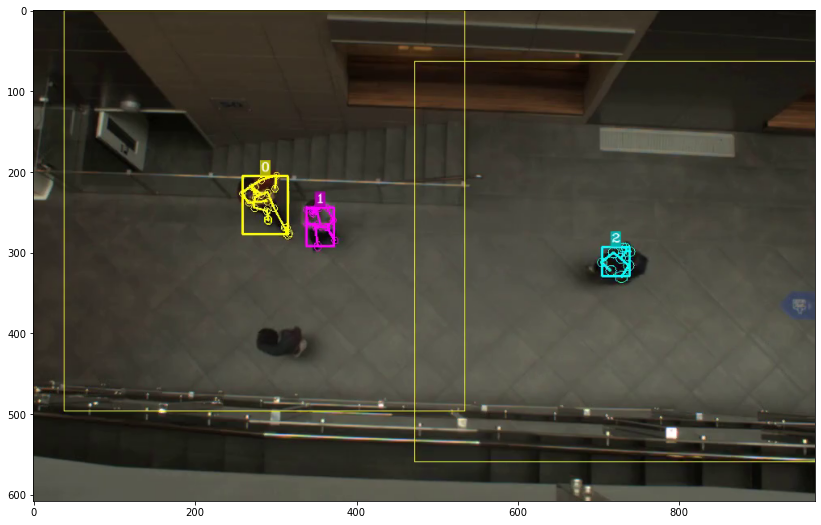

1


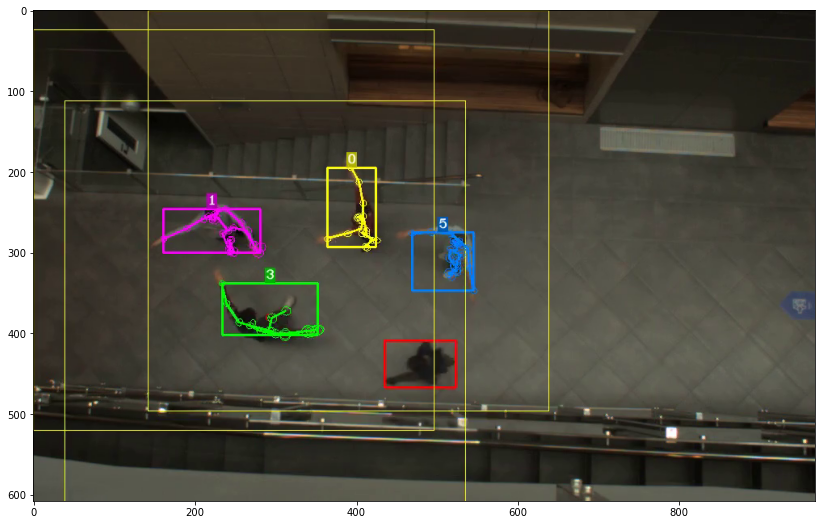

2


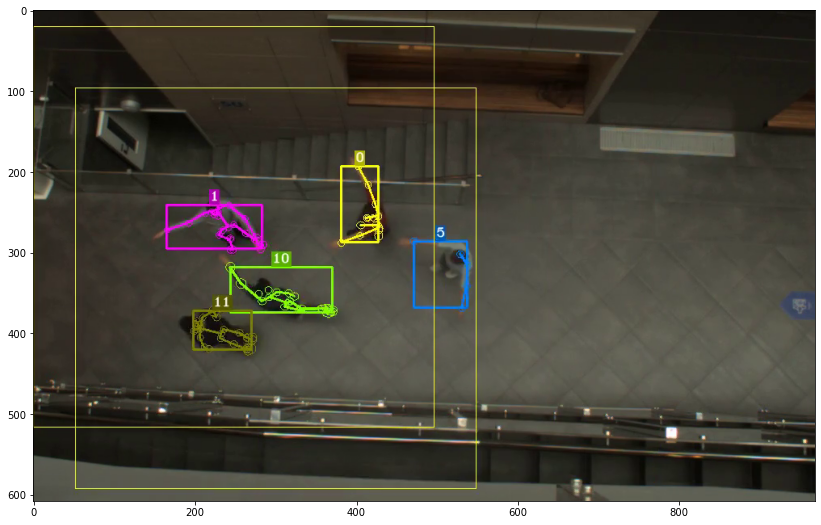

3


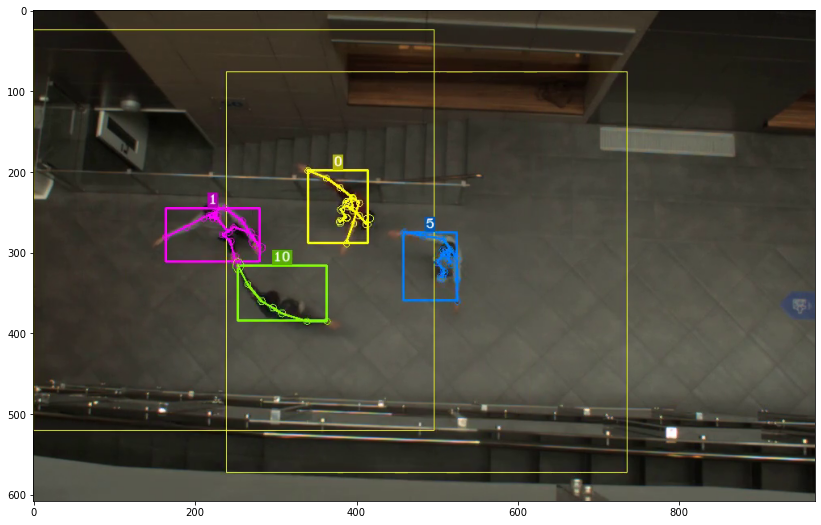

4


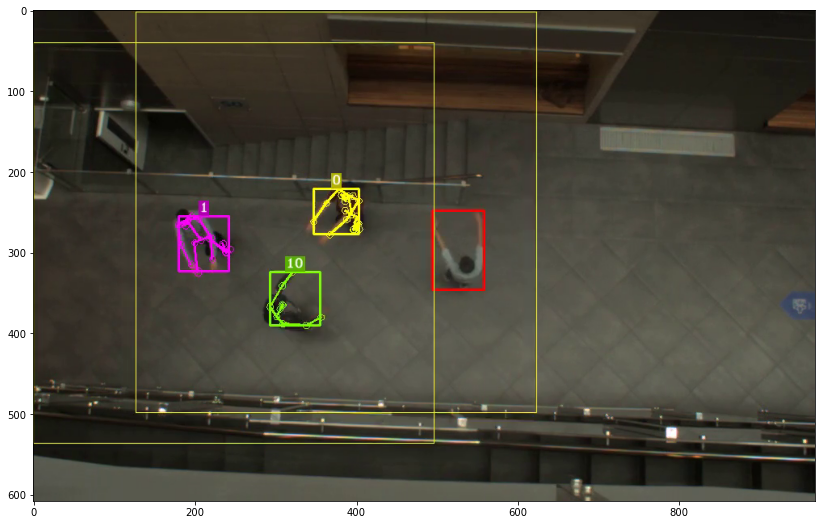

5


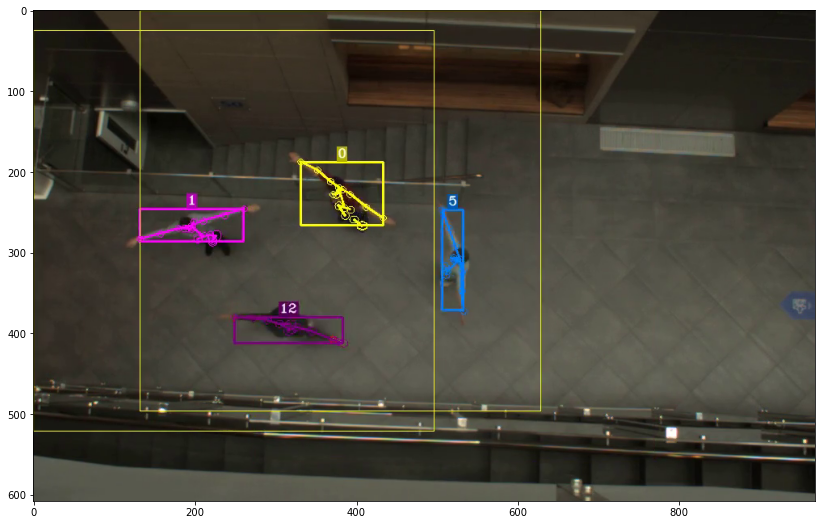

6


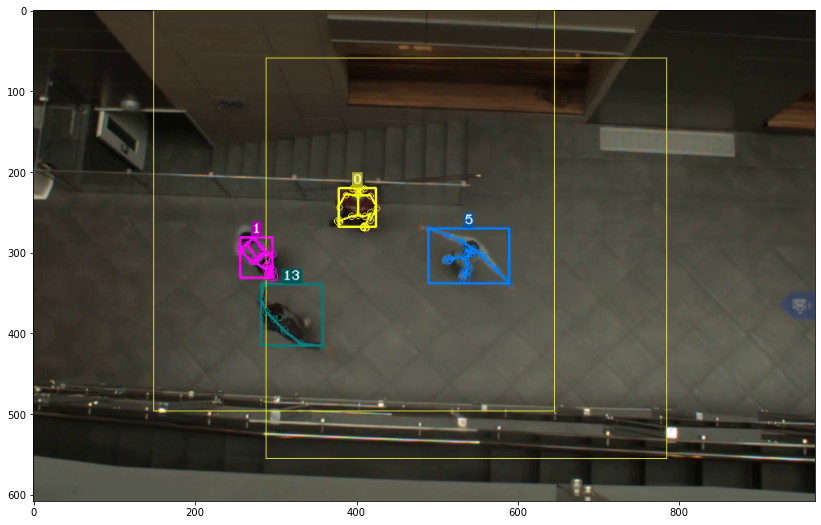

7


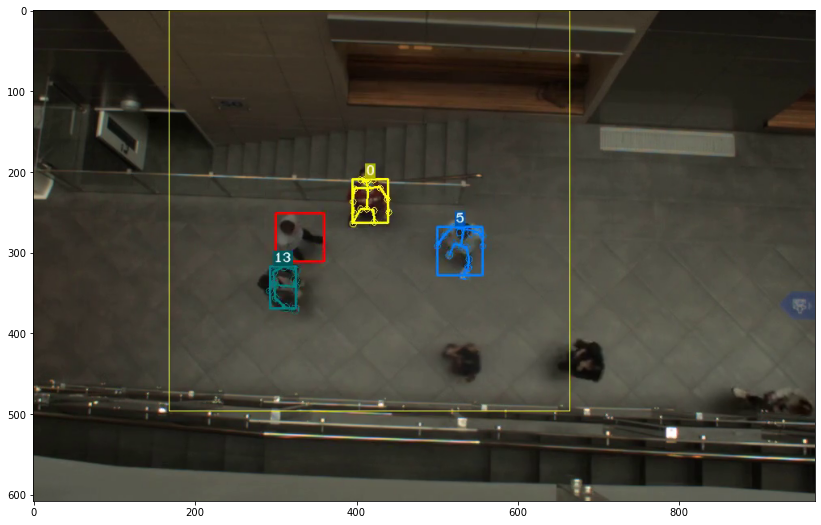

8


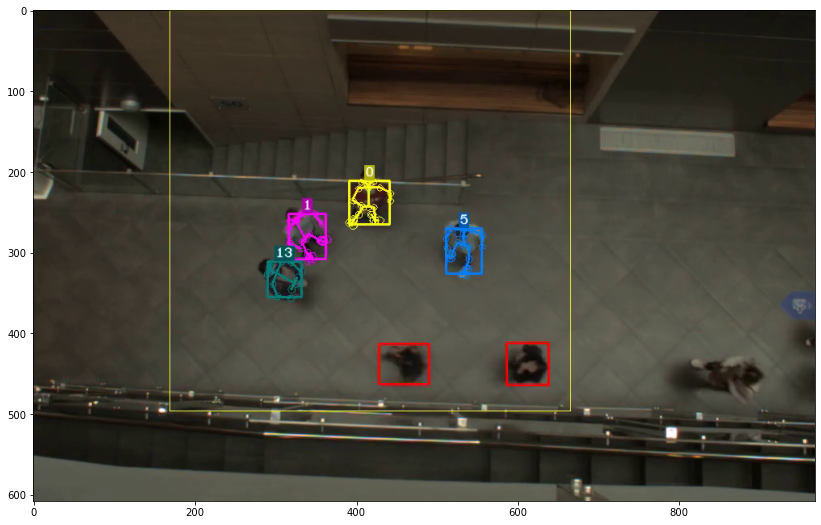

In [774]:
for i, num in enumerate(key_frames):
    print(i)
    show_frame(num+1)

In [ ]:
# 0, 8 - локти в стороны, кисти близко спереди (1 в общих значениях)
# 1,2,3 - Г
# 4 - руки вперед
# 5 - Т
# 6, 7 - руки по швам

In [821]:
def from_0(numbers):
    res = []
    for el in numbers:
        if el == 0 or el == 8:
            res.append(1)
        if el == 1 or el == 2 or el == 3:
            res.append(4)
        if el == 4:
            res.append(3)
        if el == 5:
            res.append(2)
        if el == 6 or el == 7:
            res.append(7)
        if el == -1:
            res.append(-1)
    return res

In [839]:
noise = df_scaled0[df_scaled0['label'] == -1].drop(columns=['new_index'])
noise = noise.sample(50)
noise.head()

,kisti,plecho_locot_l,plecho_locot_r,locot_kist_l,locot_kist_r,plecho_kist_l,plecho_kist_r,golova_kist_l,golova_kist_r,label
131,0.589797,0.498987,0.546311,0.536465,0.757120,0.603128,1.010786,0.557535,0.464620,-1
1089,2.720173,0.621367,0.588897,0.517356,0.690913,1.122675,1.277894,1.184564,1.707568,-1
87,0.450178,0.752575,0.689555,0.735543,0.730037,0.780435,1.146193,1.021844,0.959971,-1
1805,1.455134,0.524882,0.620148,0.509662,0.610666,0.976290,1.205738,1.002188,1.112499,-1
897,3.089571,0.742387,0.741684,1.120278,0.834787,1.842812,1.576249,1.755468,1.954847,-1


In [840]:
data0 = pd.DataFrame(scaler.inverse_transform(clustering0.components_))
data0.columns = names
data0['label'] = from_0(labels[clustering0.core_sample_indices_])
data_clusters = data_clusters.append(data0, ignore_index=True)
data_clusters = data_clusters.append(noise, ignore_index=True)
data_clusters

,kisti,plecho_locot_l,plecho_locot_r,locot_kist_l,locot_kist_r,plecho_kist_l,plecho_kist_r,golova_kist_l,golova_kist_r,label
0,0.494957,0.617218,0.621340,0.414530,0.385987,0.862819,0.787829,0.807189,0.488387,0
1,0.496934,0.617000,0.622239,0.415156,0.353681,0.864464,0.787879,0.808564,0.488729,0
2,0.437373,0.617953,0.623331,0.415231,0.416274,0.864286,0.768141,0.830966,0.481011,0
3,0.490477,0.634722,0.621826,0.391812,0.351816,0.864972,0.772627,0.808645,0.521893,0
4,0.494980,0.605790,0.622377,0.416046,0.346655,0.866419,0.742949,0.809428,0.489846,0
...,...,...,...,...,...,...,...,...,...,...
1633,0.573107,0.826770,0.636360,0.602576,0.630720,0.741539,1.146921,0.677193,0.463270,-1
1634,3.340302,0.864205,0.805629,0.897496,0.863930,1.761326,1.667836,1.868704,1.947214,-1
1635,1.838153,0.500316,0.743882,0.444006,0.610358,0.925911,1.171383,0.862642,1.415379,-1
1636,1.834656,0.523894,0.797834,0.567508,0.795186,1.056446,1.549710,0.621278,1.724846,-1


### KNN for pose recognition

In [905]:
X_, y_ = data_clusters.drop(columns=['label']), data_clusters['label']

knn = KNeighborsClassifier()
params = {'n_neighbors':range(1,11), 'weights': ('uniform', 'distance')}
clf = GridSearchCV(knn, params)
clf.fit(X_, y_)

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(1, 11),
                         'weights': ('uniform', 'distance')})

In [906]:
clf.best_score_

0.8723372119042292

In [907]:
clf.best_params_

{'n_neighbors': 3, 'weights': 'distance'}

### Testing on other people

In [847]:
df_scaled5 = pd.DataFrame()

pl = np.nanmedian(video_res[5]['plechi'])
for key in video_res[5].keys():
    df_scaled5[key] = video_res[5][key]/pl
    
df_scaled5 = df_scaled5.drop(columns=['plechi'])
df_scaled5 = df_scaled5.dropna()

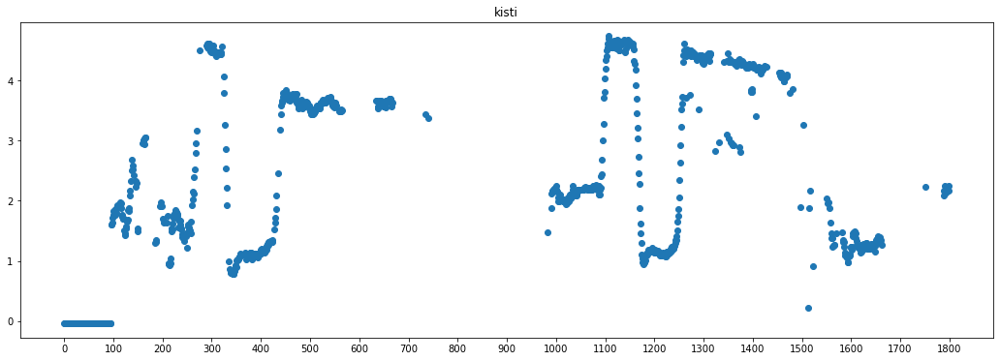

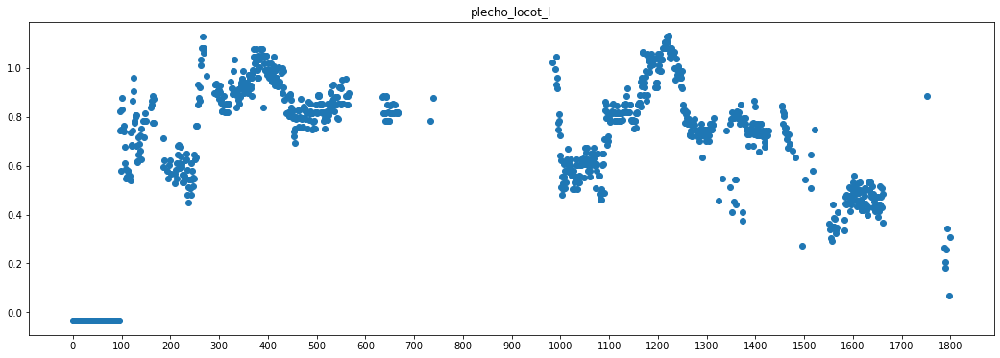

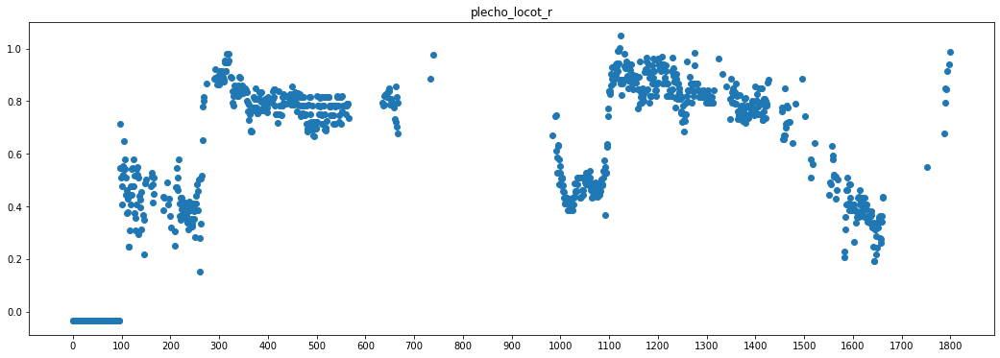

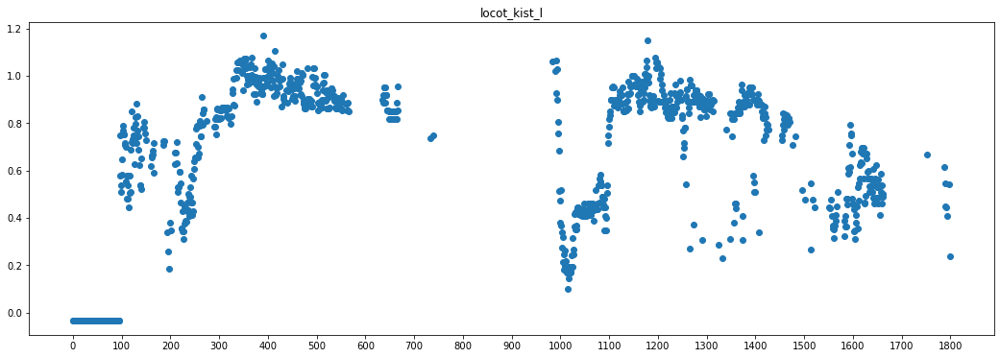

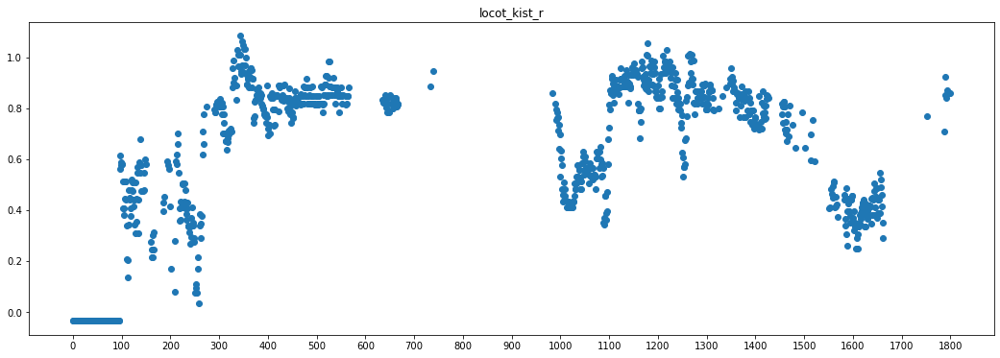

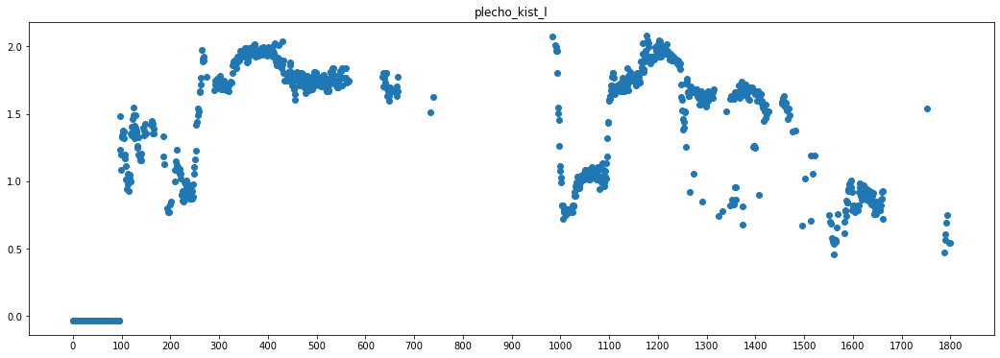

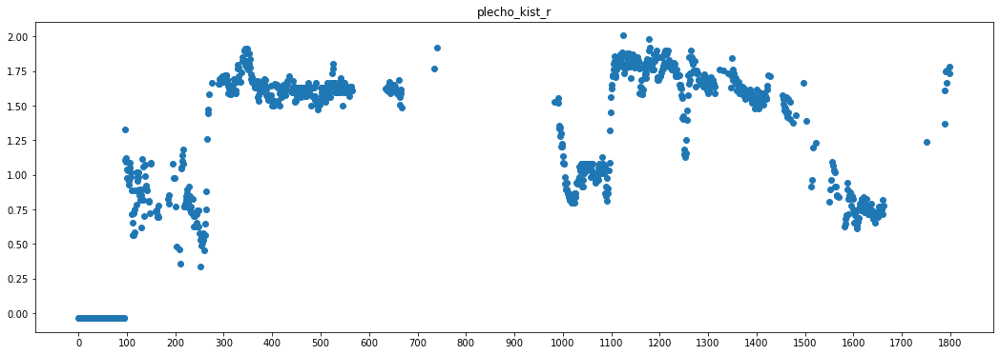

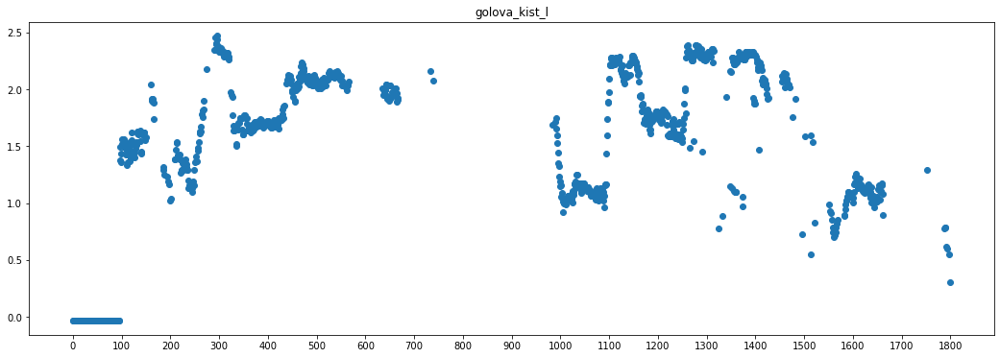

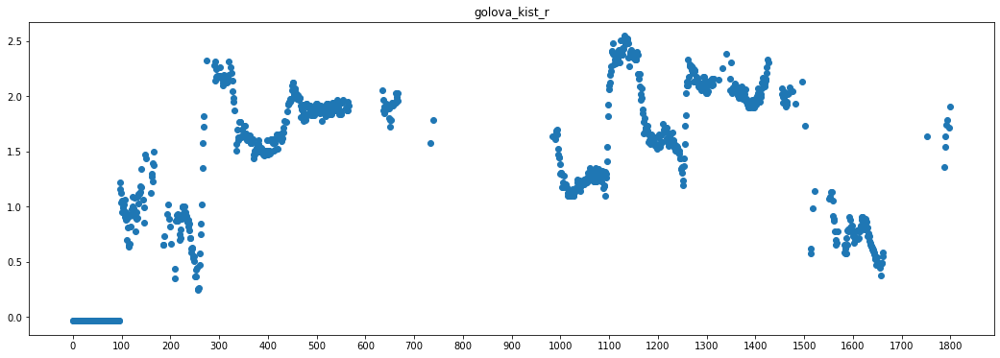

In [849]:
for col in df_scaled5.columns:
    fig, ax = plt.subplots(figsize=(18, 6))
    scatter = plt.scatter(df_scaled5.index, df_scaled5[col])
    plt.xticks(np.arange(0, 1851, 100))
    plt.title(col)
    plt.show()

In [915]:
knn = KNeighborsClassifier(3)
print(sum(cv(knn, X_, y_, cv=5, n_jobs=-1))/5)

knn.fit(X_, y_)

0.8698963228164391


KNeighborsClassifier(n_neighbors=3)

KNeighborsClassifier(n_neighbors=3)

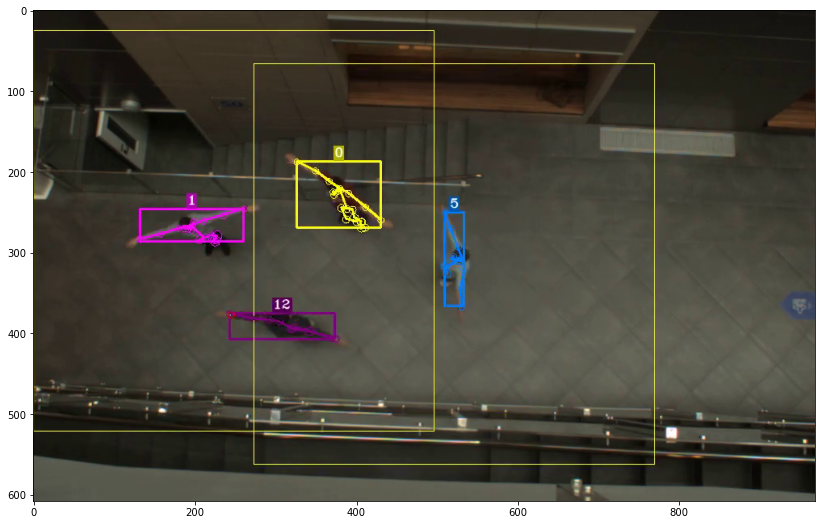

In [893]:
show_frame(1100)

In [895]:
for i in range(1100,1150):
    t = df_scaled5.loc[i].values.reshape(1, -1)
    print(knn.predict(t))

[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[-1]
[2]
[2]
[2]
[2]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[2]
[2]
[-1]
[-1]
[-1]
[2]
[-1]
[2]


KeyError: 1142

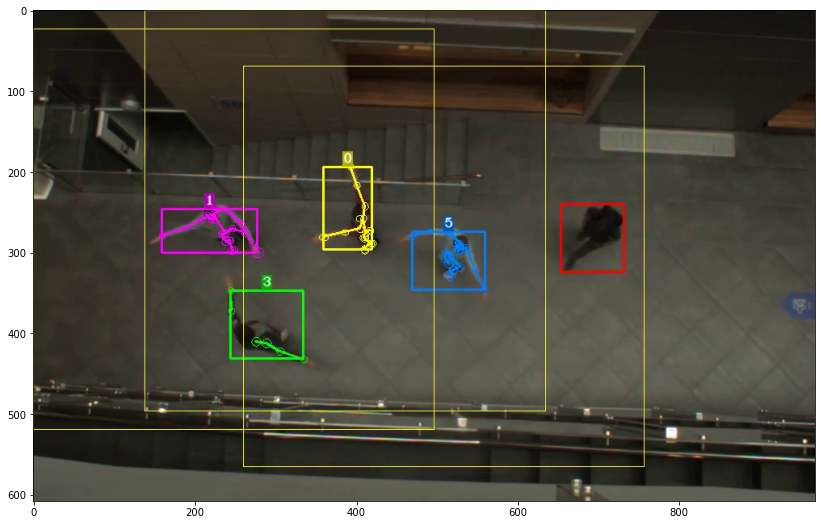

In [886]:
show_frame(450)

In [894]:
for i in range(450,500):
    t = df_scaled5.loc[i].values.reshape(1, -1)
    print(knn.predict(t))

[-1]
[4]
[4]
[-1]
[-1]
[4]
[4]
[4]
[4]
[4]
[-1]
[-1]
[4]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[4]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[-1]
[4]
[-1]
[4]
[-1]
[-1]
[-1]
[4]
[4]
[4]


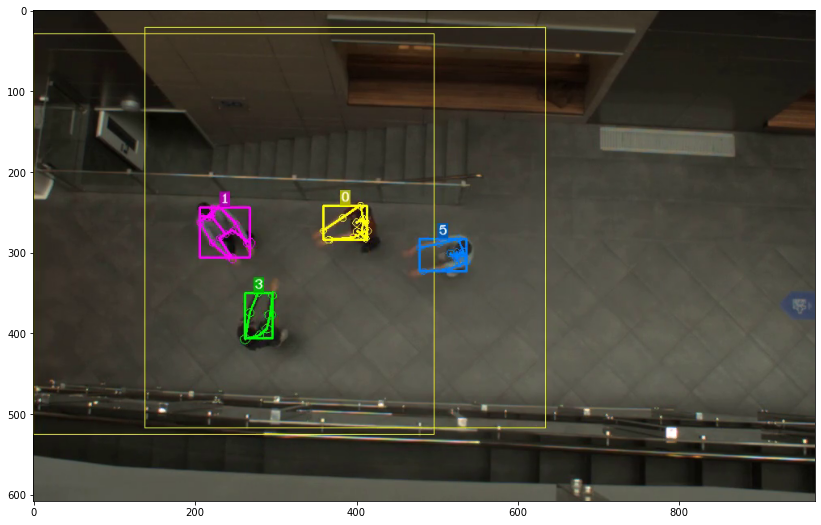

In [904]:
show_frame(336)

In [901]:
for i in range(335,400):
    try:
        t = df_scaled5.loc[i].values.reshape(1, -1)
        print(knn.predict(t))
    except:
        None

[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]
[3]


### Generalised function

In [ ]:
# ГЛОБАЛЬНЫЕ ОБОЗНАЧЕНИЯ

# 0 - руки скрещены
# 1 - локти в стороны, кисти близко спереди
# 2 - руки в стороны (Т)
# 3 - руки вперед
# 4 - одна рука вперед, одна в сторону (Г) 
# 5 - руки вверх
# 7 - руки "по швам"
# -1 - шум, переход между позами
# -2 - нет в кадре

In [924]:
video_res = video_analysis(data['FrameSequences'][0]['Frames'])

def get_poses(person, track):
    df = pd.DataFrame()
    pl = np.nanmedian(video_res[track]['plechi'])
    for key in video_res[track].keys():
        df[key] = video_res[track][key]/pl
    df = df.drop(columns=['plechi'])
    
    res = [-2 for i in range(len(df+1))]
    df = df.dropna()
    
    for index, row in df.iterrows():
        res[index] = clf.predict(row.values.reshape(1, -1))[0]
    return res

Counter(get_poses(video_res[5], 5))

Counter({-2: 921, -1: 503, 7: 1, 4: 61, 2: 168, 3: 159, 5: 18, 1: 20})